In [149]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [150]:
# Load file into dataframe
data = pd.read_csv('stocks_log_norm_scaled.csv', index_col=0)
data = data.drop(columns=['permno'])
data.head()

,date,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,name_price_attention,volatility,industry,stock_dummy,log_return,log_name_price_attention
0,2014-01-02,MSFT,-0.999221,1.117934,-0.006683,-0.992613,-1.004799,-0.997672,-0.998750,0.138220,-0.419196,-0.712226,-0.494860,Technology,20,-0.006705,1.423108
1,2014-01-03,MSFT,-1.001527,1.148820,-0.006728,-0.994243,-1.009502,-0.999057,-1.001888,0.132557,-0.421781,-0.816796,-0.438358,Technology,20,-0.006751,0.932164
2,2014-01-06,MSFT,-1.008721,1.870624,-0.021133,-0.997232,-1.014112,-1.002286,-1.005672,0.114890,-1.249333,-0.771331,-0.410107,Technology,20,-0.021359,1.175573
3,2014-01-07,MSFT,-1.006139,1.417816,0.007750,-1.000854,-1.013171,-1.007130,-1.007056,0.121232,0.409965,-0.839528,-0.498392,Technology,20,0.007720,0.783902
4,2014-01-08,MSFT,-1.012134,2.840056,-0.017852,-1.004023,-1.019098,-1.010129,-1.011579,0.106510,-1.060843,-0.807703,-0.448952,Technology,20,-0.018013,0.985817


In [151]:
# summary statistics
data.describe()

,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,name_price_attention,volatility,stock_dummy,log_return,log_name_price_attention
count,7.044800e+04,7.044800e+04,70448.000000,7.044800e+04,7.044800e+04,7.044800e+04,70448.000000,7.044800e+04,7.044800e+04,7.044800e+04,7.044800e+04,70448.000000,70448.000000,70448.000000
mean,-2.969336e-16,1.936523e-17,0.000614,9.037110e-17,-1.291016e-16,-1.032813e-16,0.000000,-2.582031e-17,-2.138245e-17,-2.259277e-17,3.873047e-17,13.500000,0.000462,2.000092
std,1.000007e+00,1.000007e+00,0.017407,1.000007e+00,1.000007e+00,1.000007e+00,1.000007,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00,8.077805,0.017416,1.379421
min,-1.145044e+00,-6.688350e-01,-0.238484,-1.135511e+00,-1.153717e+00,-1.145396e+00,-1.144624,-6.566479e-01,-1.373592e+01,-9.168190e-01,-5.319401e-01,0.000000,-0.272444,0.000000
25%,-5.986486e-01,-4.895764e-01,-0.006783,-5.956138e-01,-6.012235e-01,-5.987912e-01,-0.598519,-4.114707e-01,-4.249406e-01,-9.168190e-01,-3.641986e-01,6.750000,-0.006806,0.000000
50%,-1.803673e-01,-3.193574e-01,0.000619,-1.804125e-01,-1.802450e-01,-1.806257e-01,-0.181005,-2.439655e-01,2.964425e-04,-2.881008e-01,-2.176436e-01,13.500000,0.000619,2.368373
75%,2.846076e-01,8.092260e-02,0.008153,2.801576e-01,2.888051e-01,2.843435e-01,0.284456,-2.598057e-02,4.331168e-01,5.016940e-01,6.133531e-02,20.250000,0.008120,3.128513
max,1.930693e+01,3.598990e+01,0.260449,1.966413e+01,1.921553e+01,1.983467e+01,19.447214,7.704748e+00,1.492726e+01,5.578204e+00,5.663966e+01,27.000000,0.231468,4.615121


In [152]:
# Adding the dummy variable for covid. 

split_date = '2020-01-01'
data['Post-covid'] = (data['date'] >= split_date).astype(int)

data = data.rename(columns={'log_name_price_attention': 'log_attention', 'volatility':'daily_spread'})
data.head()

,date,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,name_price_attention,daily_spread,industry,stock_dummy,log_return,log_attention,Post-covid
0,2014-01-02,MSFT,-0.999221,1.117934,-0.006683,-0.992613,-1.004799,-0.997672,-0.998750,0.138220,-0.419196,-0.712226,-0.494860,Technology,20,-0.006705,1.423108,0
1,2014-01-03,MSFT,-1.001527,1.148820,-0.006728,-0.994243,-1.009502,-0.999057,-1.001888,0.132557,-0.421781,-0.816796,-0.438358,Technology,20,-0.006751,0.932164,0
2,2014-01-06,MSFT,-1.008721,1.870624,-0.021133,-0.997232,-1.014112,-1.002286,-1.005672,0.114890,-1.249333,-0.771331,-0.410107,Technology,20,-0.021359,1.175573,0
3,2014-01-07,MSFT,-1.006139,1.417816,0.007750,-1.000854,-1.013171,-1.007130,-1.007056,0.121232,0.409965,-0.839528,-0.498392,Technology,20,0.007720,0.783902,0
4,2014-01-08,MSFT,-1.012134,2.840056,-0.017852,-1.004023,-1.019098,-1.010129,-1.011579,0.106510,-1.060843,-0.807703,-0.448952,Technology,20,-0.018013,0.985817,0


In [193]:
temp = data.copy()
temp = temp.drop(columns=['name_price_attention','stock_dummy', 'log_return', 'Post-covid'])
temp.sample(5)

,date,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,daily_spread,industry,log_attention
25927,2017-01-19,CRM,-0.644950,-0.492705,-0.002771,-0.641526,-0.645062,-0.643634,-0.643363,-0.563408,-0.194455,-0.401278,Technology,1.928619
68808,2017-06-26,TSLA,2.139780,-0.295163,-0.015543,2.172787,2.156069,2.225672,2.164934,-0.534243,-0.928193,1.897664,Technology,2.089392
39652,2021-08-06,DIS,0.291779,-0.360353,0.002377,0.287945,0.307808,0.294839,0.297735,0.174801,0.101292,-0.162909,Entertainment,2.215937
65201,2023-02-23,MMM,-0.337442,-0.512310,-0.000275,-0.332547,-0.337724,-0.330102,-0.335140,-0.539174,-0.051063,-0.145252,Industrial,1.974081
45382,2014-05-19,IBM,0.382814,-0.492918,-0.000321,0.363288,0.396331,0.379543,0.379556,-0.186929,-0.053706,-0.355368,Technology,2.844909


Text(0, 0.5, 'Frequency')

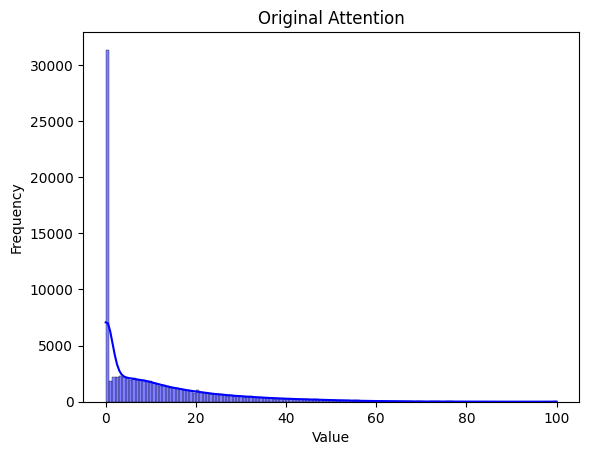

In [153]:
google_trends = pd.read_csv("google_trends.csv")
sns.histplot(google_trends['name_price_attention'], kde=True, color='blue')
plt.title('Original Attention')
plt.xlabel('Value')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

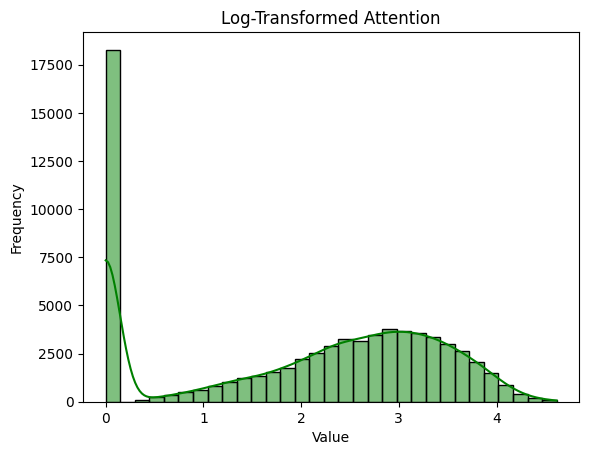

In [154]:
sns.histplot(data['log_attention'], kde=True, color='green')
plt.title('Log-Transformed Attention')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Correlation


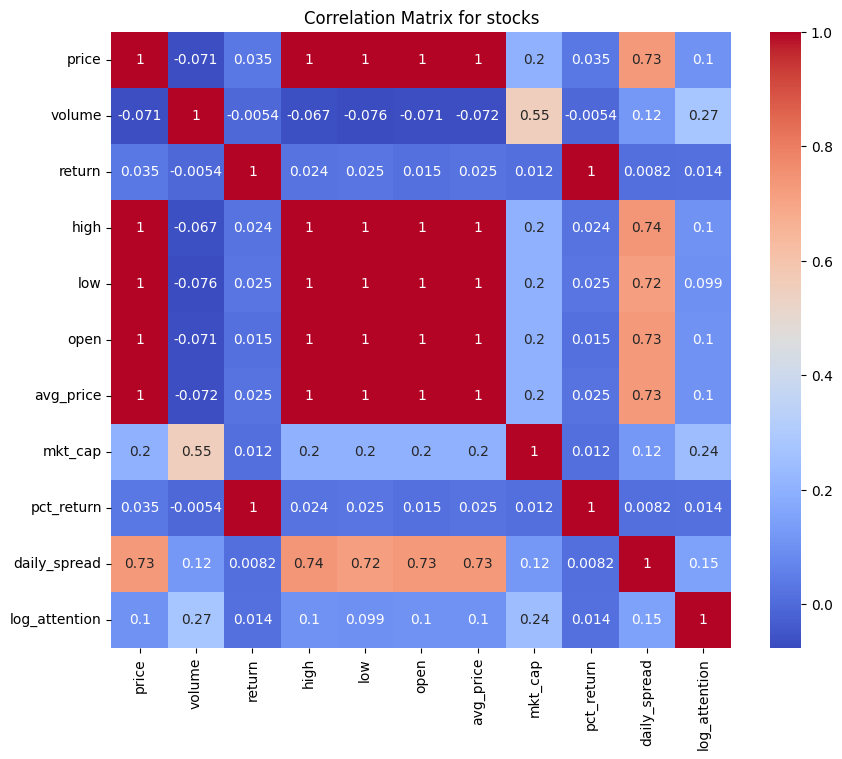

In [191]:
# Correlation Analysis
#setting numerical variables:
numerical = ['price', 'volume', 'return', 'high', 'low', 'open', 'avg_price', 'mkt_cap', 'pct_return', 'daily_spread', 'log_attention']
correlation_matrix = data[numerical].corr()

#plotting the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix for stocks')
plt.show()

In [156]:
#Checking the correlation between 
correlation_value = data['pct_return'].corr(data['log_attention'])

print(f"Correlation between pct_return and attention: {correlation_value}")


Correlation between pct_return and attention: 0.014060226090537803


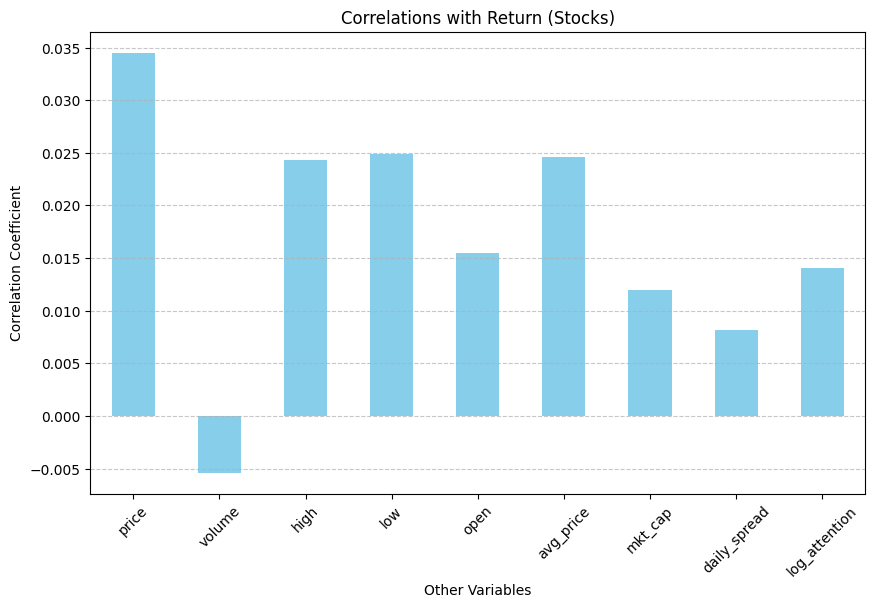

In [157]:
correlations = data[numerical].corr()['pct_return'].drop(['pct_return', 'return'])

# Plot bar graph
plt.figure(figsize=(10, 6))
correlations.plot(kind='bar', color='skyblue')
plt.title('Correlations with Return (Stocks)')
plt.xlabel('Other Variables')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


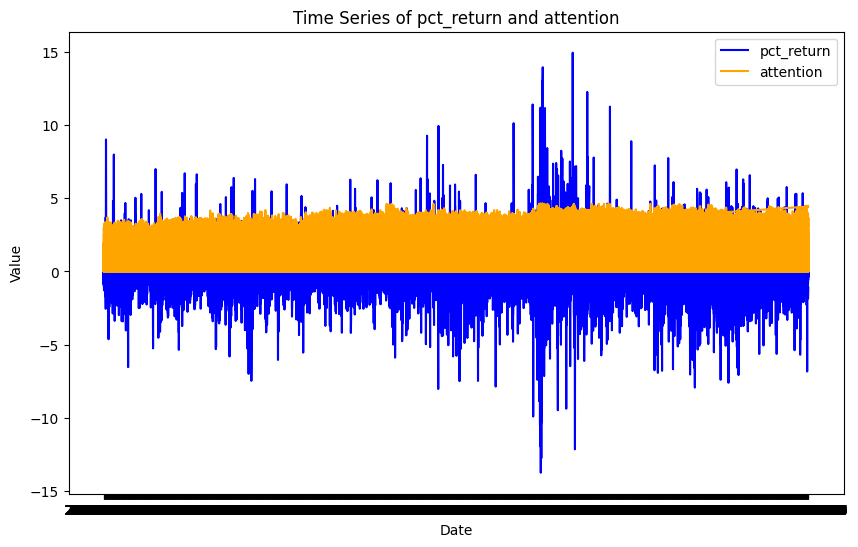

In [158]:
# Plot time series of pct_return and attention
plt.figure(figsize=(10, 6))
plt.plot(data['date'], data['pct_return'], label='pct_return', color='blue')
plt.plot(data['date'], data['log_attention'], label='attention', color='orange')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Time Series of pct_return and attention')
plt.legend()
plt.show()



# Visualizations

1. Time series of price and attention proxies
    * Time series for each stock 
    * Time series pre and post covid
    * Time series per industry
    * Quarterly and Monthly look
2. Distributions of dependend and independent variables 
3. Scatter plots with the Relationships 

### 1. Time Series Analysis

#### 1a. Stock-wise analysis

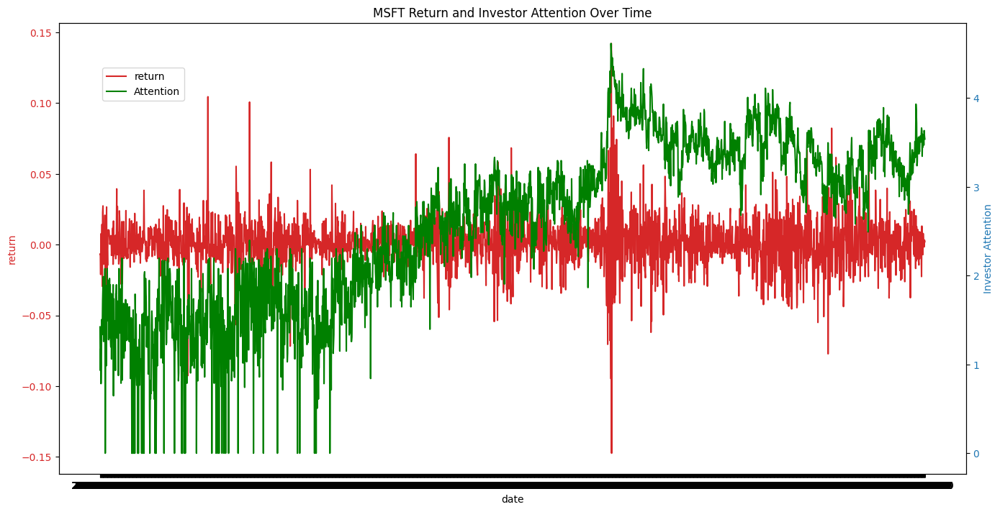

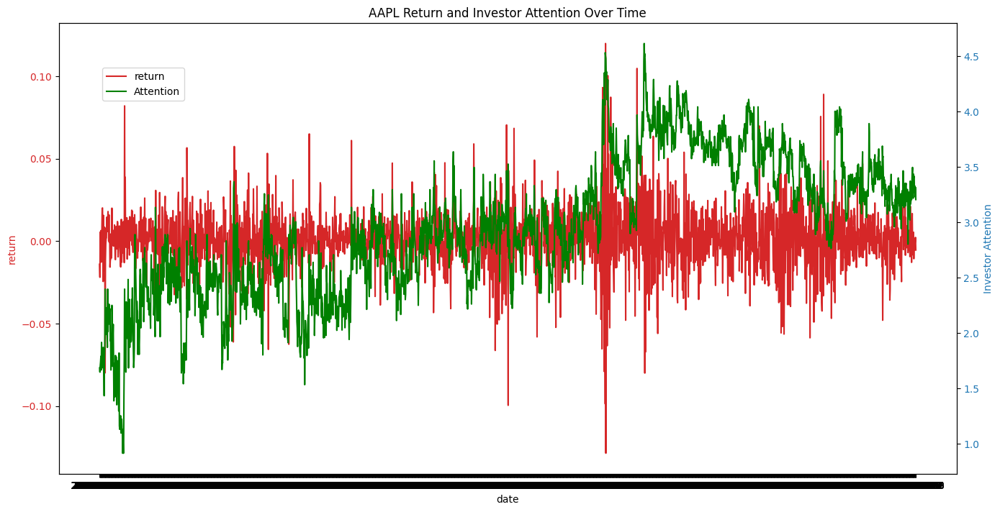

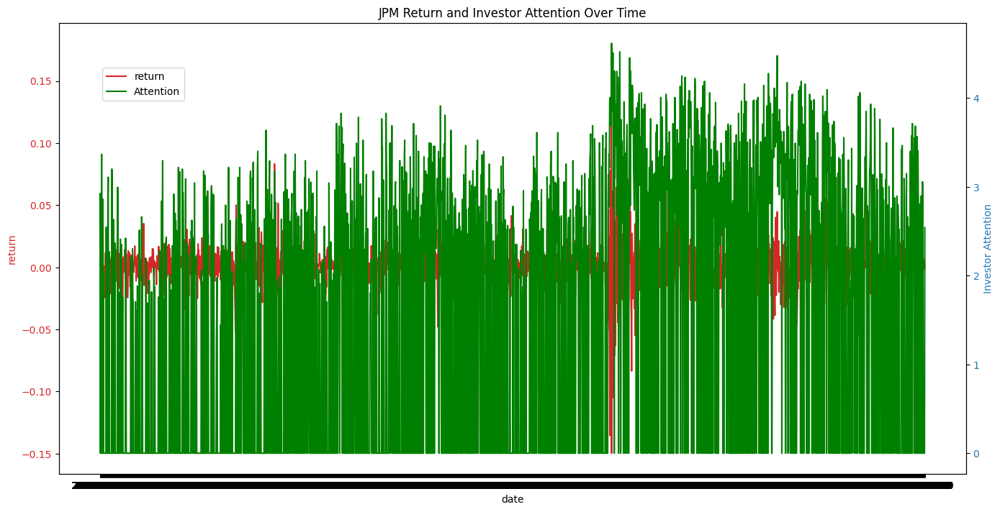

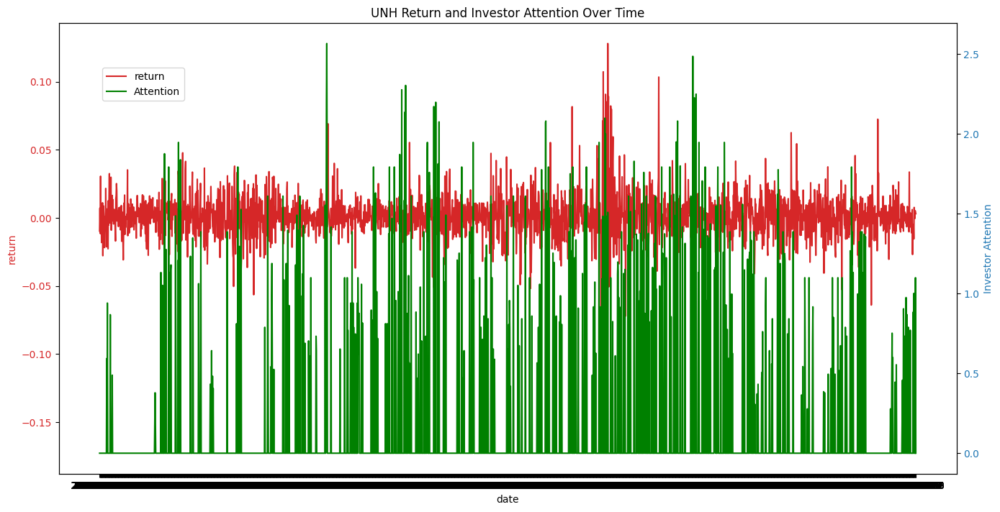

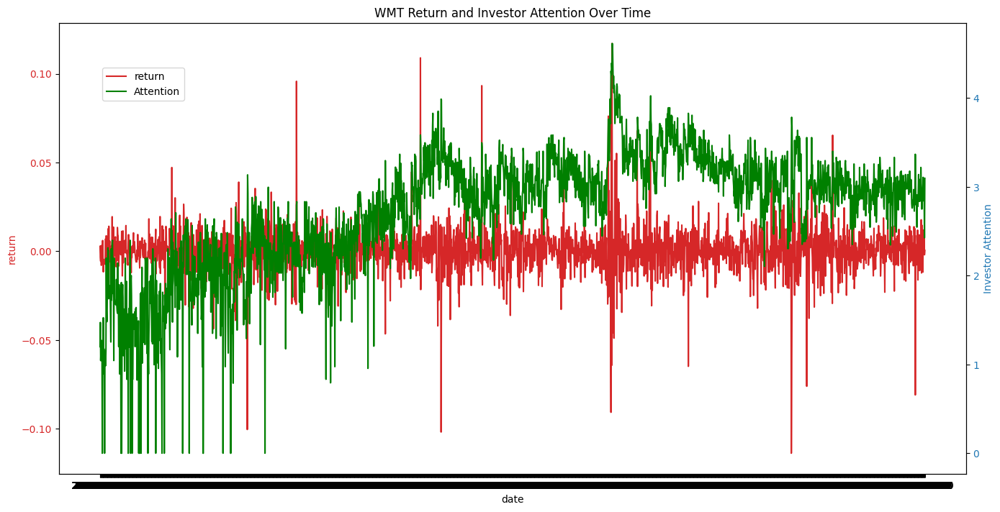

...

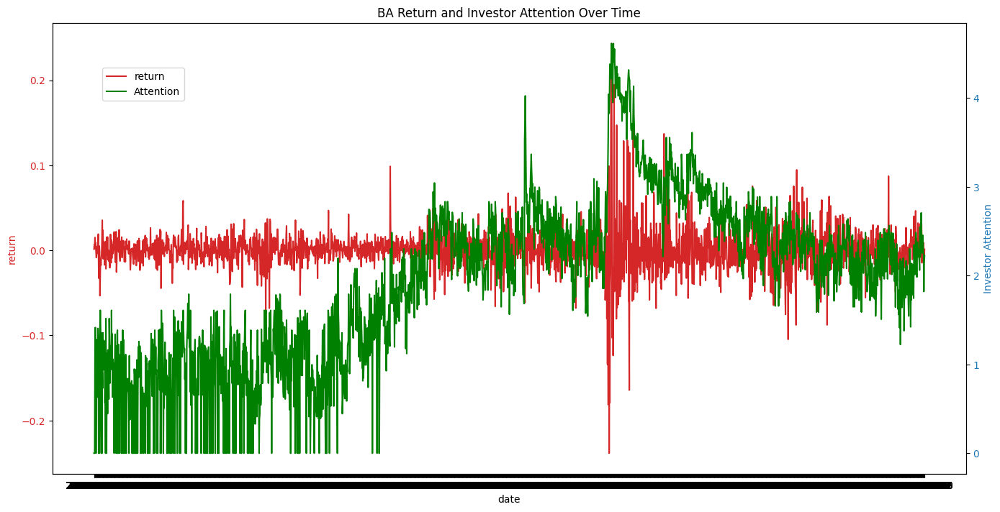

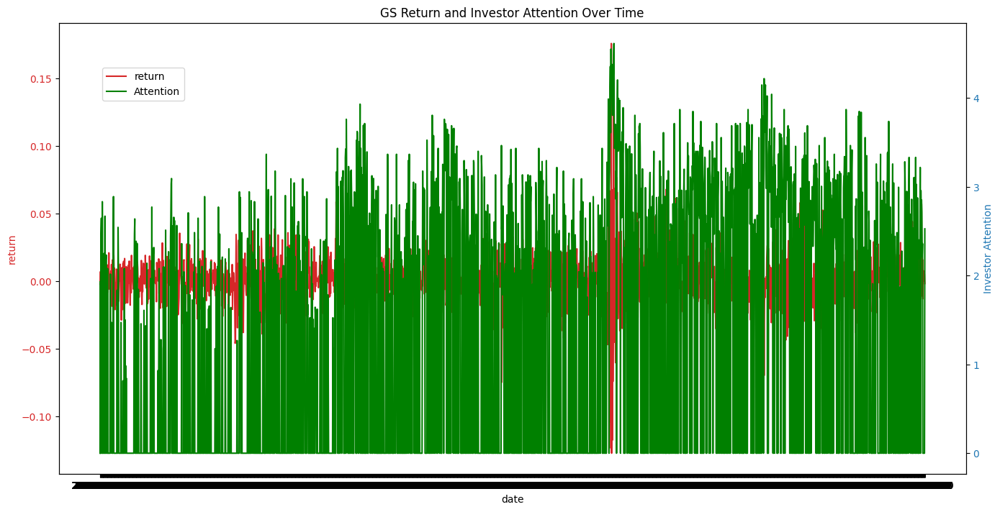

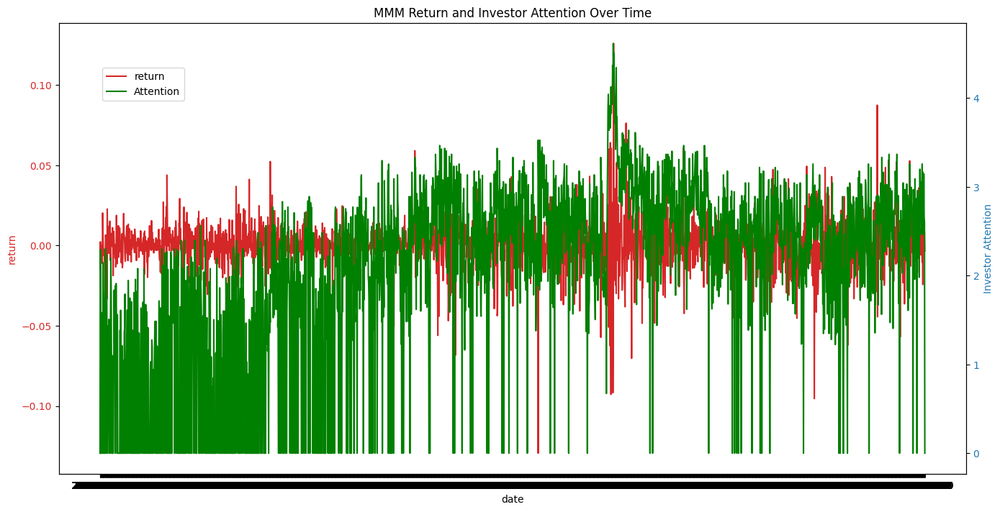

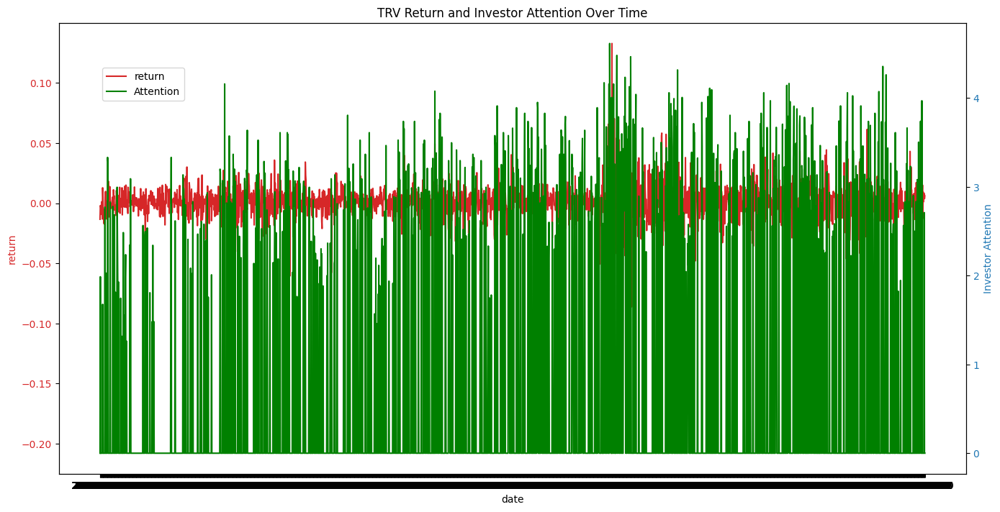

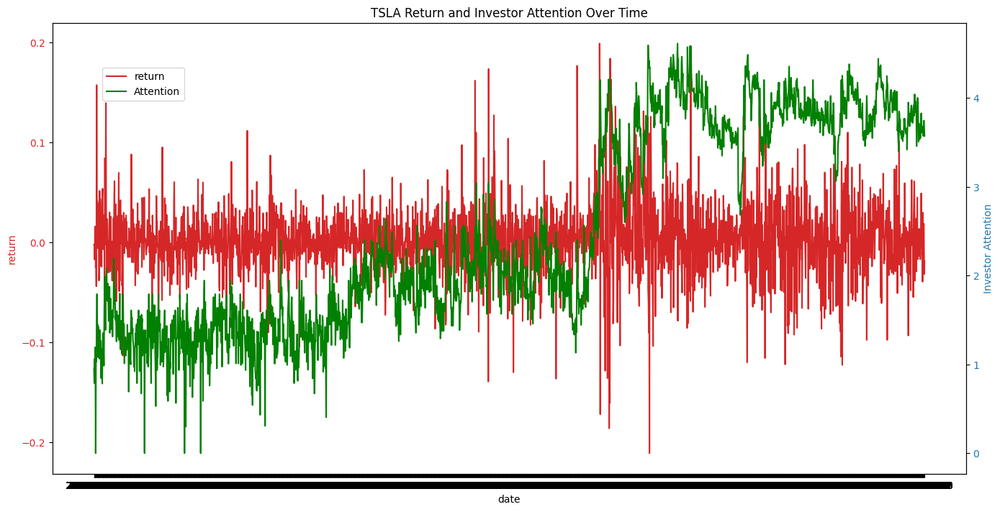

In [159]:
# Creating a time series plot for each stock containing returns and name_price_attention

stocks = data['ticker'].unique()

for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax1 = plt.subplots(figsize=(14, 7))

    color = 'tab:red'
    ax1.set_xlabel('date')
    ax1.set_ylabel('return', color=color)
    ax1.plot(stock_data['date'], stock_data['return'], color=color, label='return')
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel('Investor Attention', color=color)  # we already handled the x-label with ax1
    ax2.plot(stock_data['date'], stock_data['log_attention'], color='green', label='Attention')
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.title(f'{stock} Return and Investor Attention Over Time')
    fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9))
    plt.show()

#### 1b. Impact of Covid

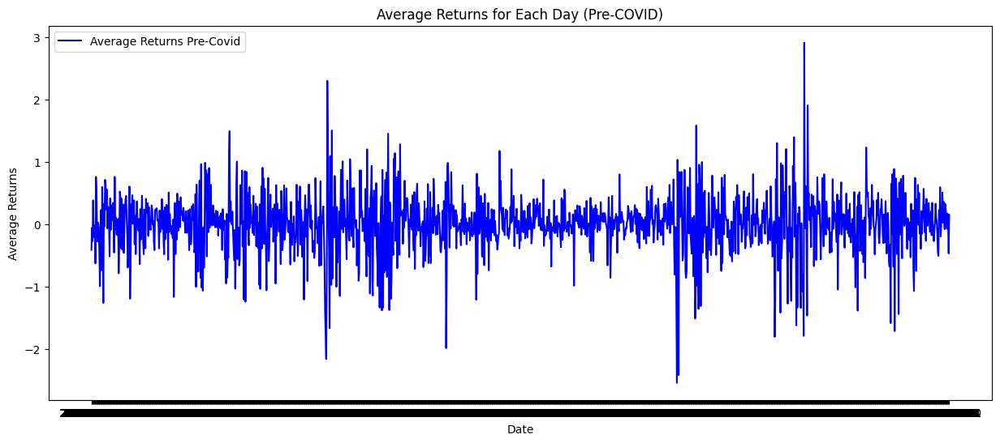

In [160]:
# Looking at the impact of Covid: Average Returns per day Pre-covid 

average_returns_pre_covid = data[data['Post-covid'] == 0].groupby('date')['pct_return'].mean()

# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_pre_covid.index, average_returns_pre_covid, label='Average Returns Pre-Covid',color='blue')
plt.title('Average Returns for Each Day (Pre-COVID)')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()

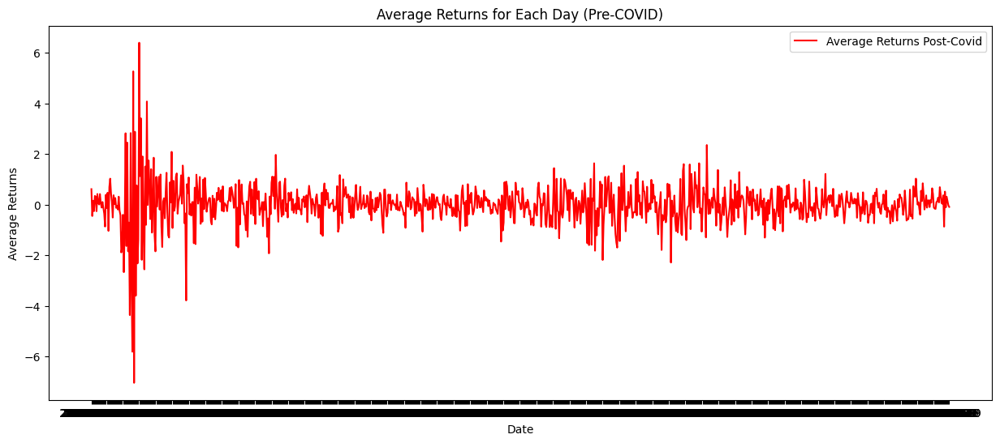

In [161]:
# Looking at the impact of Covid: Average Returns per day Pre-covid 
average_returns_post_covid = data[data['Post-covid'] == 1].groupby('date')['pct_return'].mean()

# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_post_covid.index, average_returns_post_covid, label='Average Returns Post-Covid',color='red')
plt.title('Average Returns for Each Day (Pre-COVID)')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()

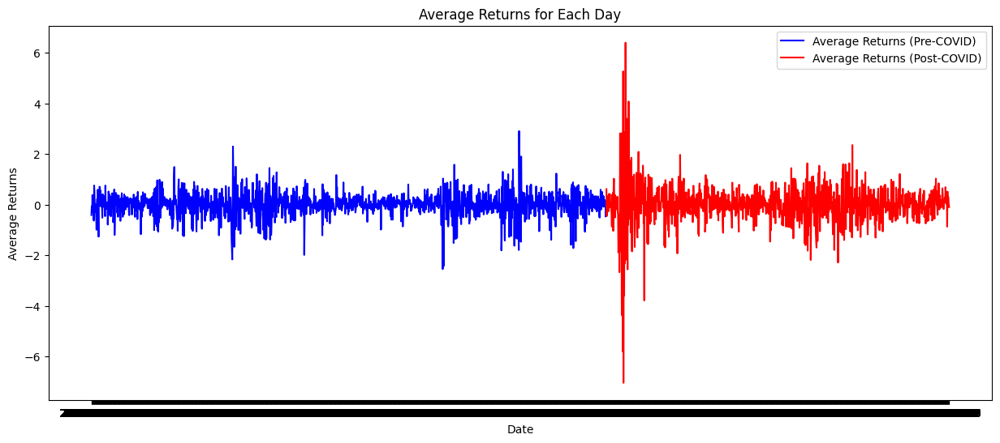

In [162]:
#Putting both together to see the on the same scale
plt.figure(figsize=(15, 6))
plt.plot(average_returns_pre_covid.index, average_returns_pre_covid, label='Average Returns (Pre-COVID)', color='blue')
plt.plot(average_returns_post_covid.index, average_returns_post_covid, label='Average Returns (Post-COVID)', color='red')
plt.title('Average Returns for Each Day')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()


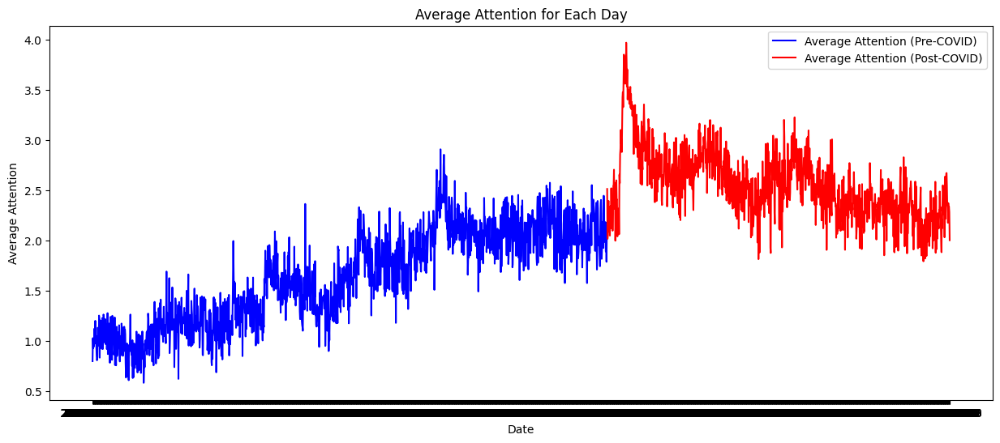

In [163]:
#Putting both together to see the on the same scale
average_attn_pre_covid = data[data['Post-covid'] == 0].groupby('date')['log_attention'].mean()
average_attn_post_covid = data[data['Post-covid'] == 1].groupby('date')['log_attention'].mean()

plt.figure(figsize=(15, 6))
plt.plot(average_attn_pre_covid.index, average_attn_pre_covid, label='Average Attention (Pre-COVID)', color='blue')
plt.plot(average_attn_post_covid.index, average_attn_post_covid, label='Average Attention (Post-COVID)', color='red')
plt.title('Average Attention for Each Day')
plt.xlabel('Date')
plt.ylabel('Average Attention')
plt.legend()
plt.show()


#### 1c. Industry related visualizations

1. Time series of returns for all industries
2. Time series of returns for each industry

In [164]:
average_returns_post_covid_by_industry = data[data['Post-covid'] == 1].groupby(['industry', 'date'])['pct_return'].mean()
average_returns_pre_covid_by_industry = data[data['Post-covid'] == 0].groupby(['industry', 'date'])['pct_return'].mean()


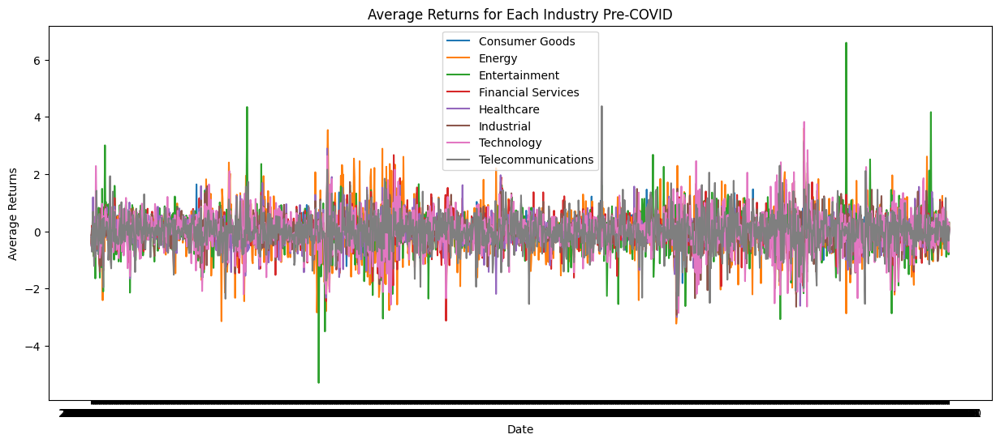

In [165]:
# Get unique industries
industries = average_returns_pre_covid_by_industry.index.get_level_values('industry').unique()

# Plotting
plt.figure(figsize=(15, 6))
for industry in industries:
    industry_data = average_returns_pre_covid_by_industry.loc[industry]
    plt.plot(industry_data.index, industry_data, label=industry)

plt.title('Average Returns for Each Industry Pre-COVID')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()

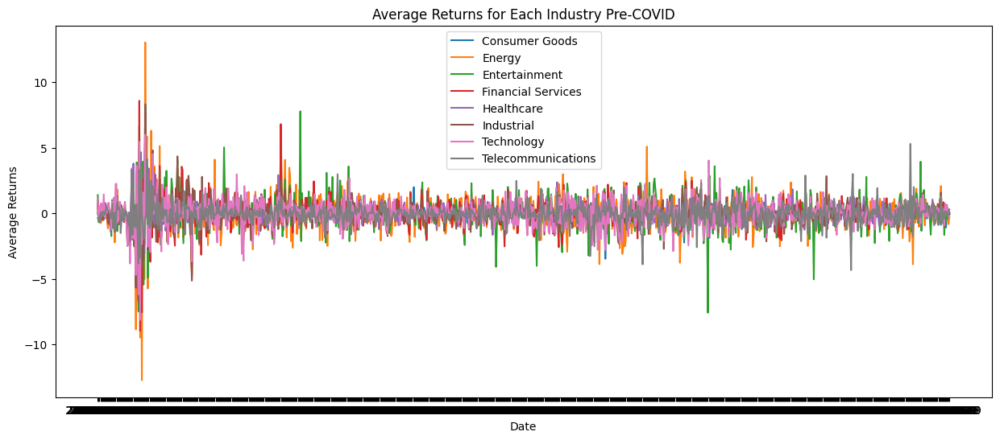

In [166]:
industries = average_returns_post_covid_by_industry.index.get_level_values('industry').unique()


# Plotting
plt.figure(figsize=(15, 6))
for industry in industries:
    industry_data = average_returns_post_covid_by_industry.loc[industry]
    plt.plot(industry_data.index, industry_data, label=industry)

plt.title('Average Returns for Each Industry Pre-COVID')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()

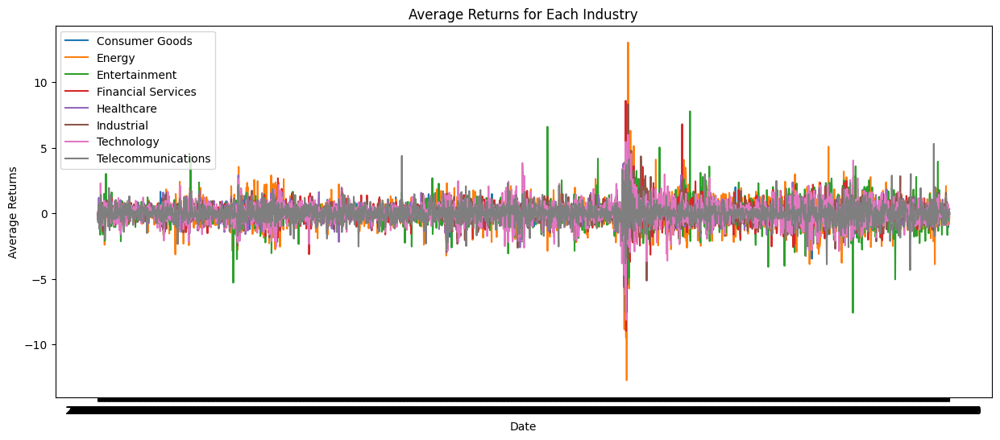

In [167]:
average_returns_by_industry = data.groupby(['industry', 'date'])['pct_return'].mean()
average_returns_by_industry.reset_index()
industries = average_returns_by_industry.index.get_level_values('industry').unique()

# Plotting
plt.figure(figsize=(15, 6))
for industry in industries:
    industry_data = average_returns_by_industry.loc[industry]
    plt.plot(industry_data.index, industry_data, label=industry)

plt.title('Average Returns for Each Industry')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()



In [168]:
average_returns_by_industry = average_returns_by_industry.reset_index()
average_returns_by_industry['date'] = pd.to_datetime(average_returns_by_industry['date'])

average_returns_by_industry.dtypes

industry              object
date          datetime64[ns]
pct_return           float64
dtype: object

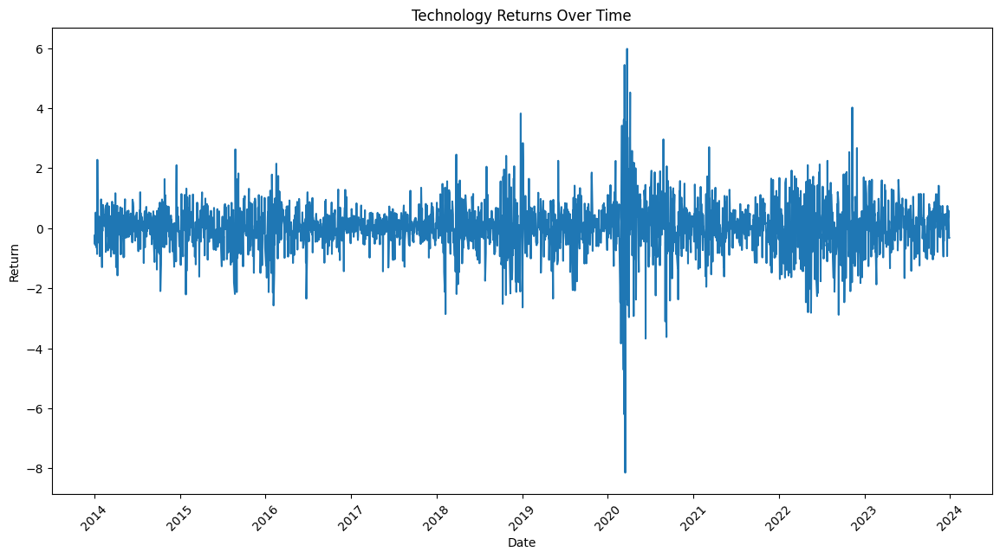

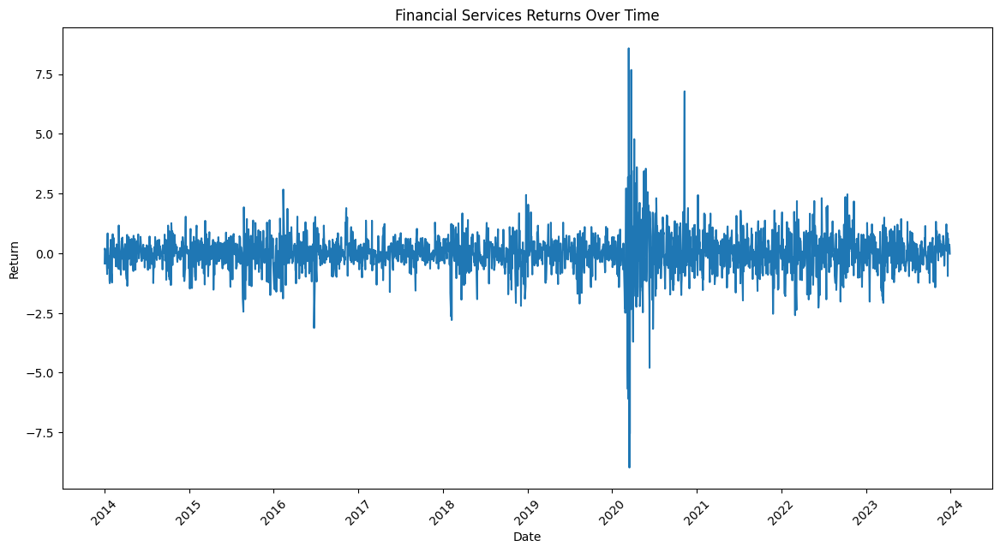

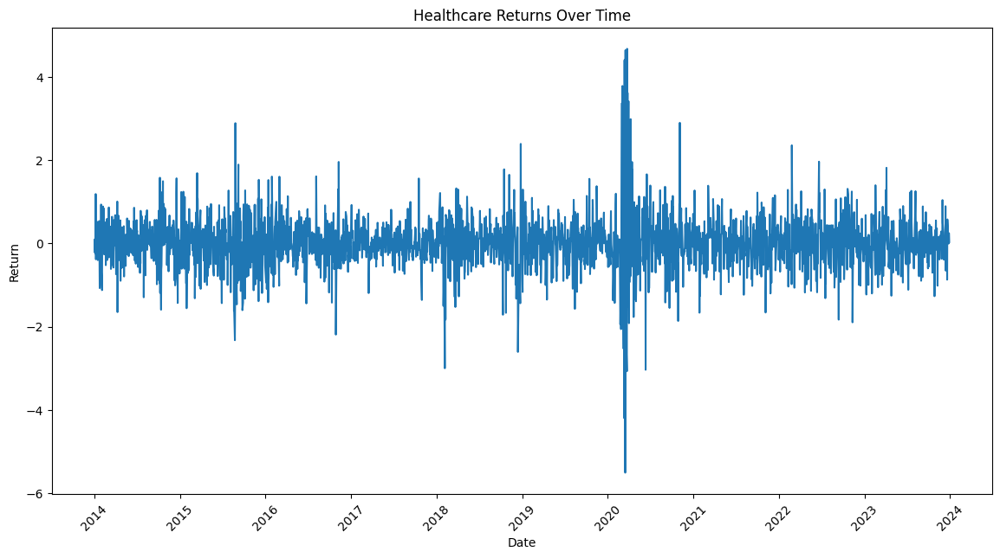

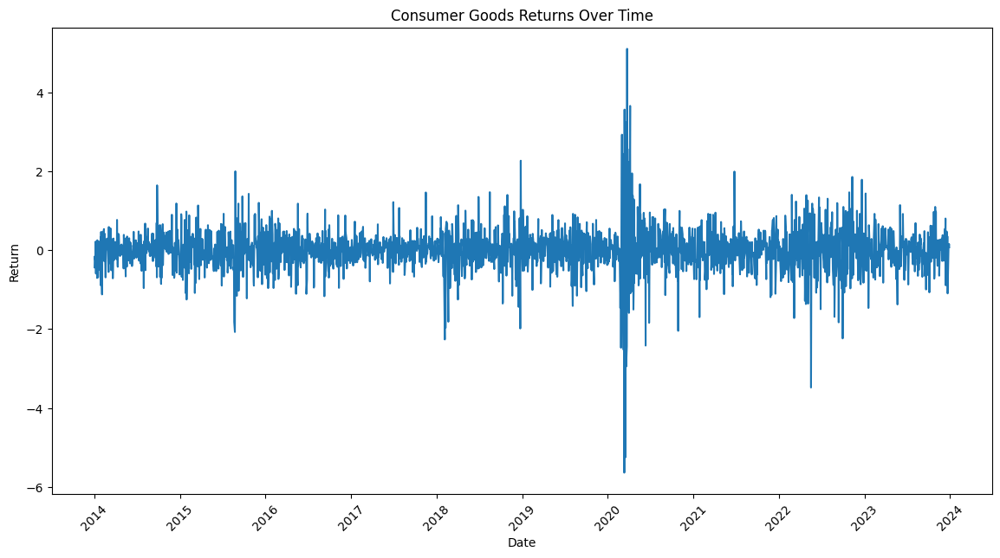

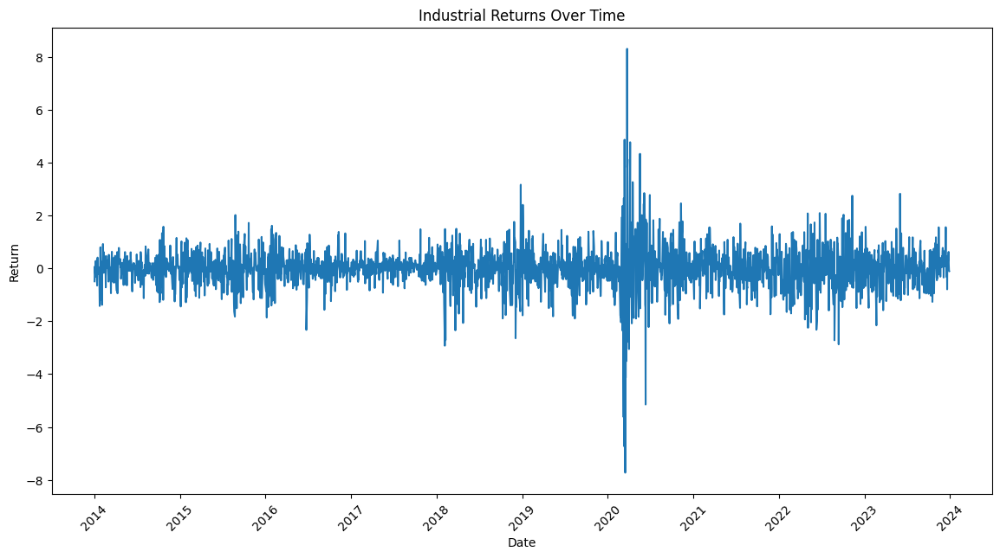

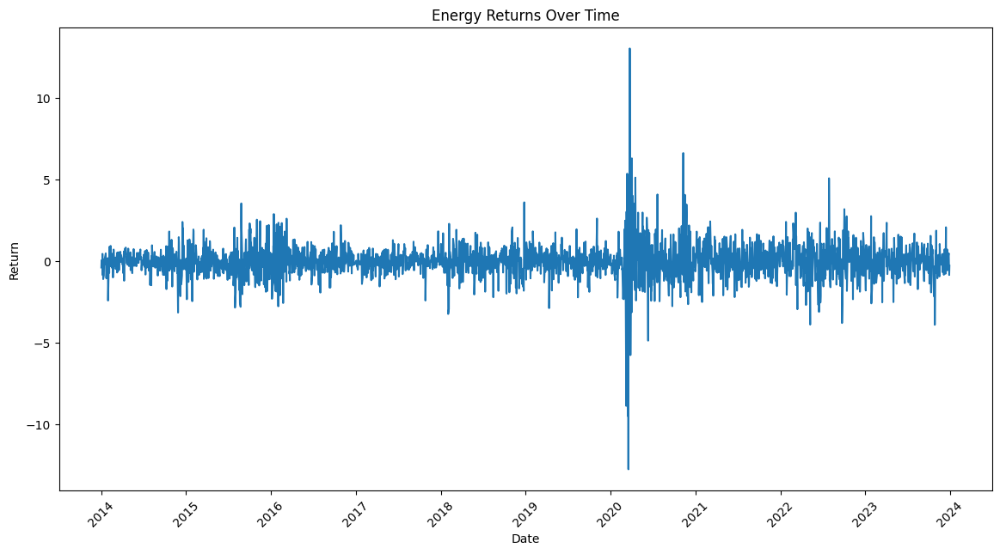

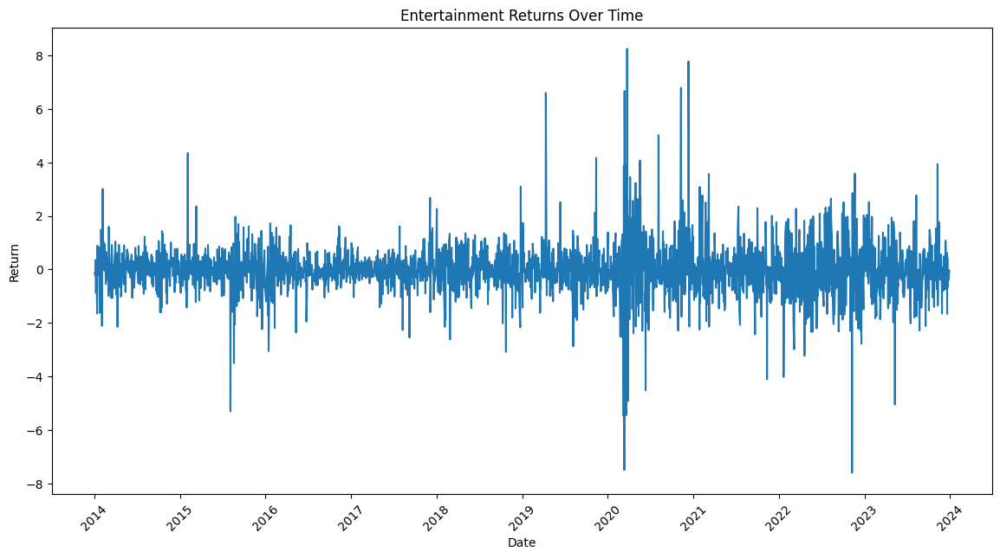

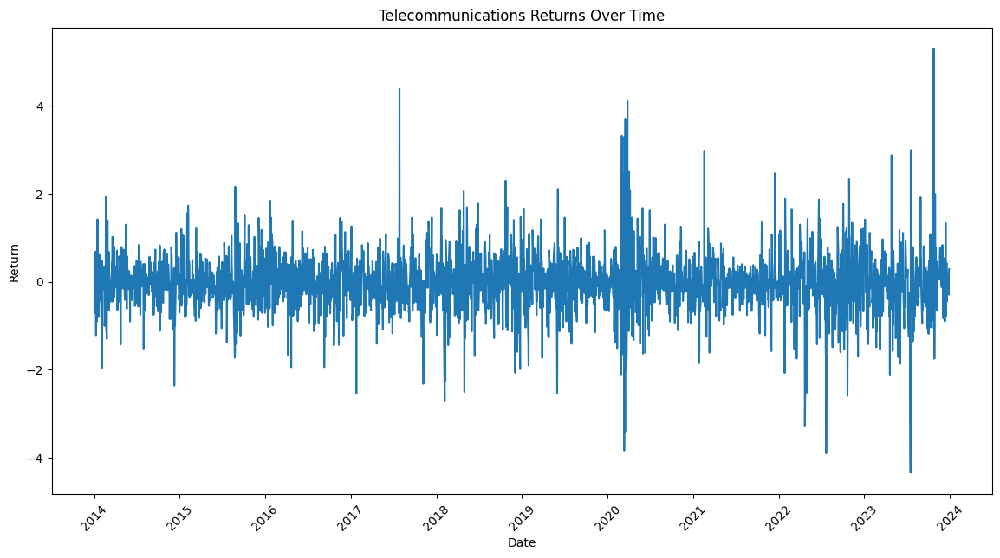

In [169]:
industries = data['industry'].unique()

for industry in industries:
    industry_data = average_returns_by_industry[average_returns_by_industry['industry'] == industry]
    plt.figure(figsize=(14, 7))
    plt.plot(industry_data['date'], industry_data['pct_return'])
    plt.title(f'{industry} Returns Over Time')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.xticks(rotation=45)
    plt.show()


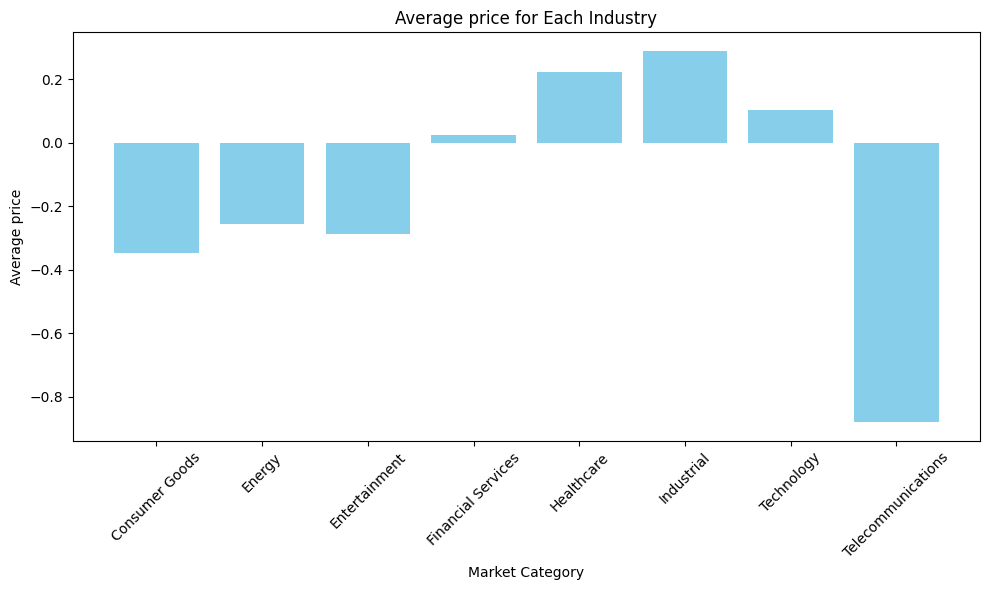

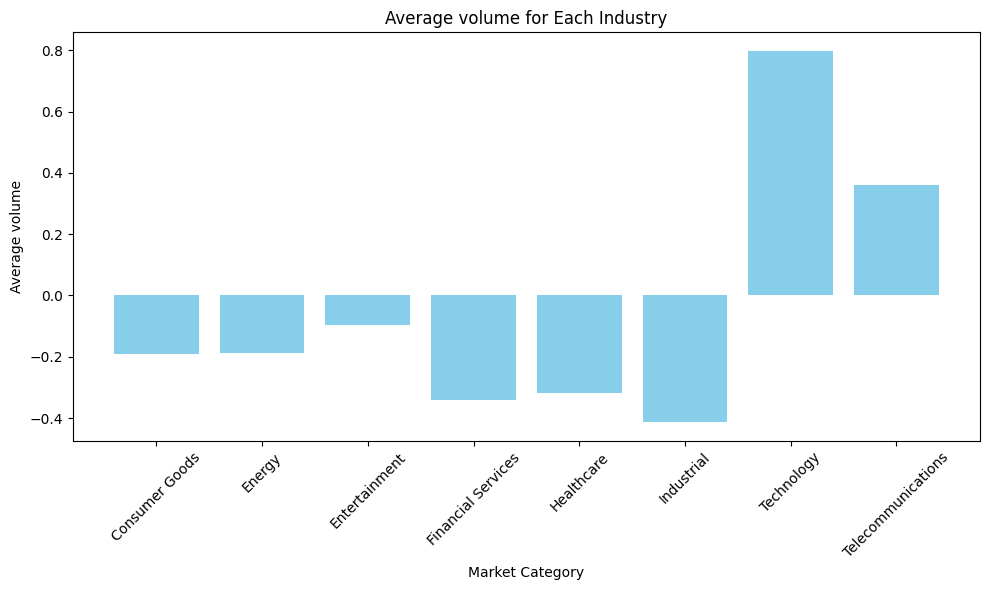

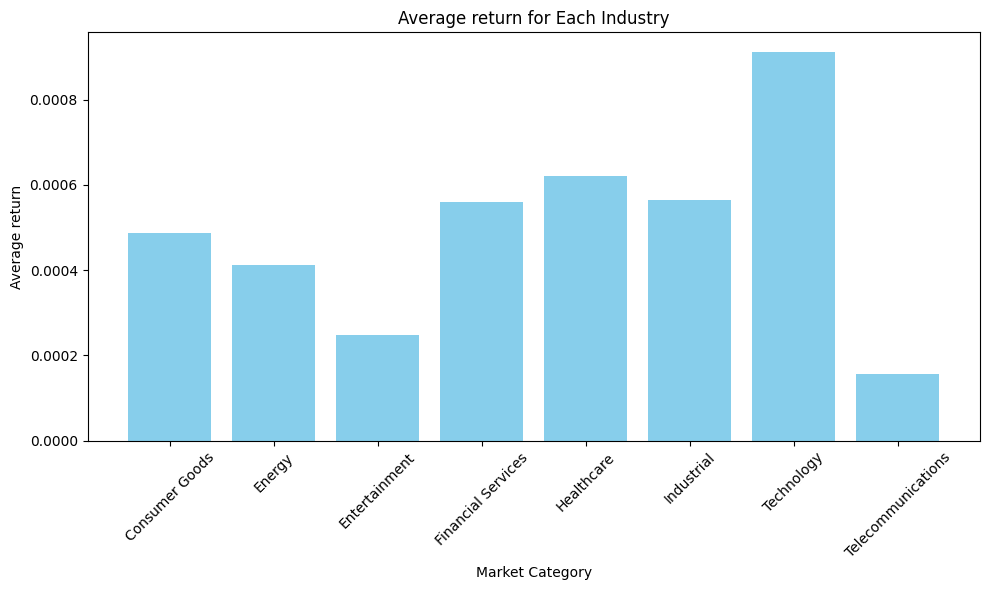

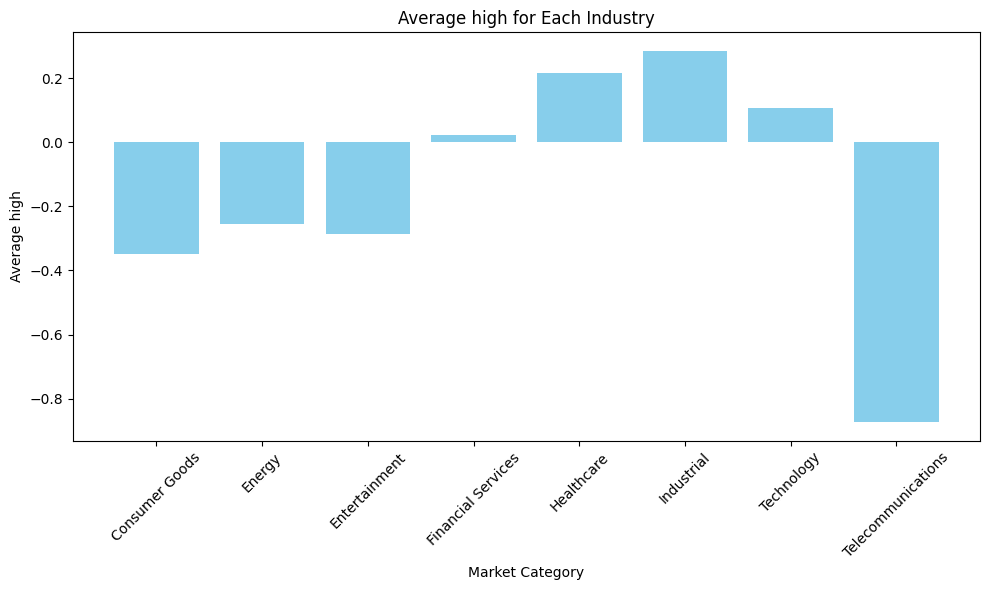

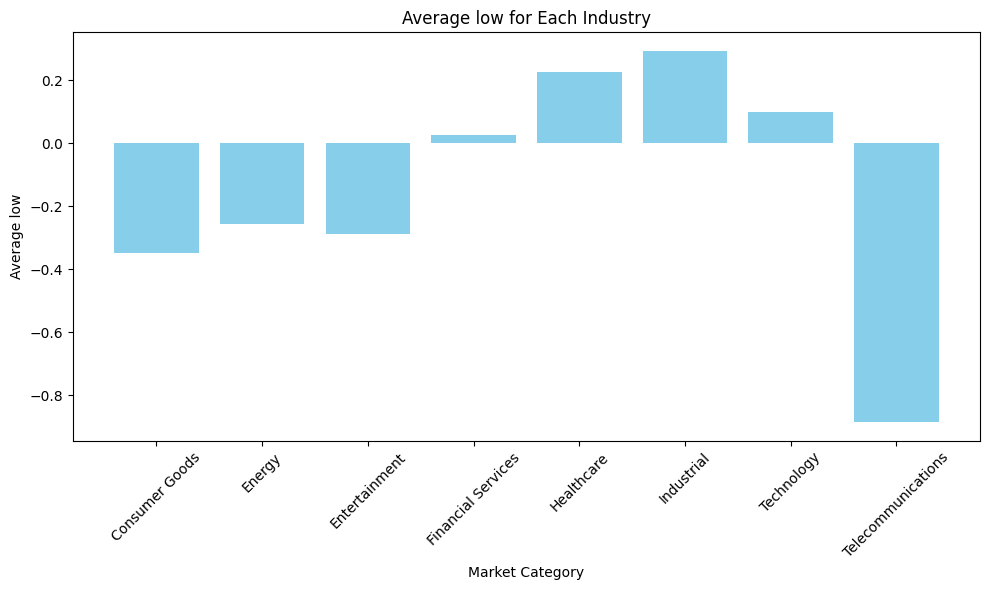

...

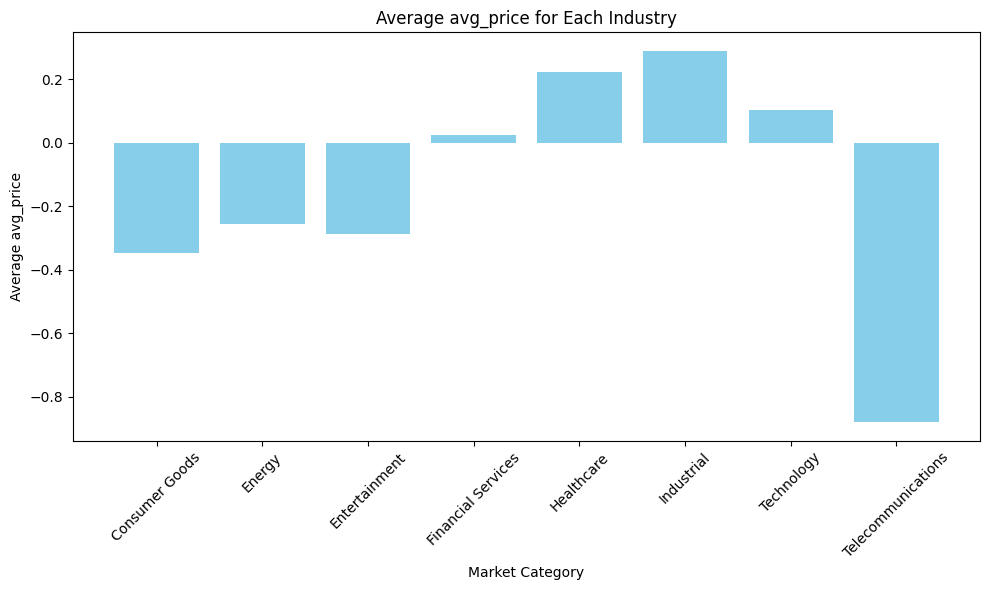

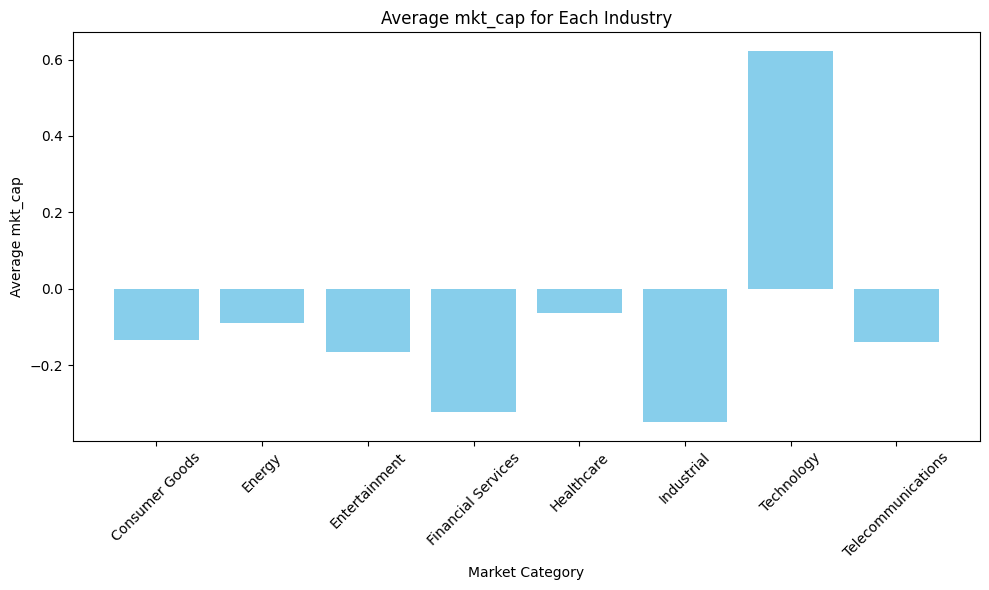

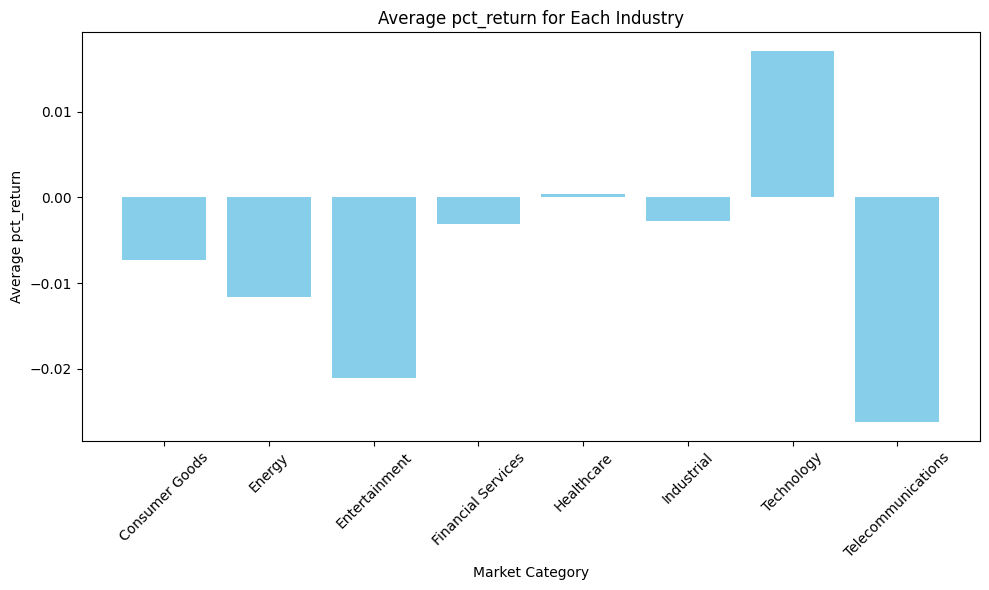

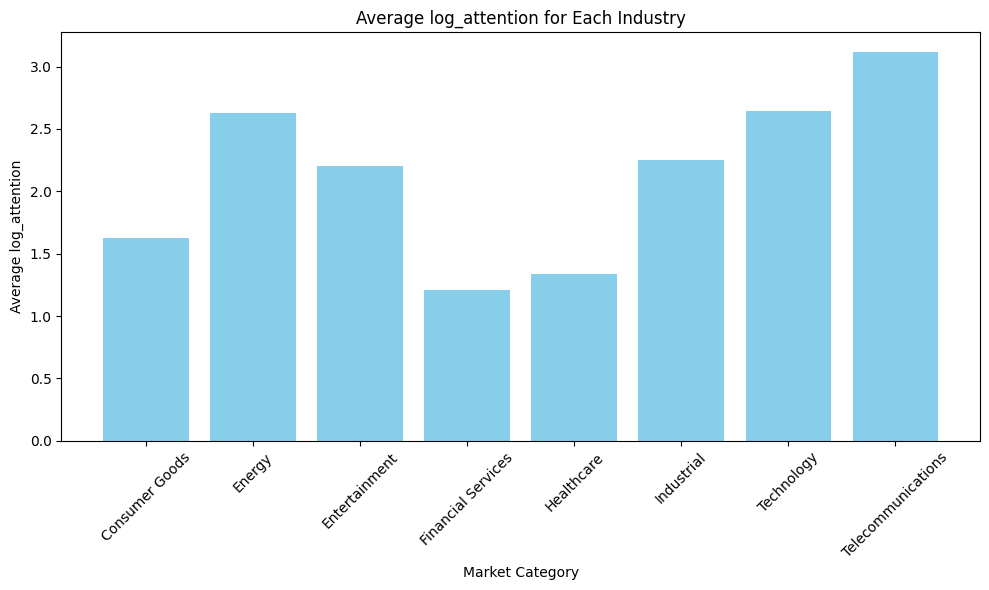

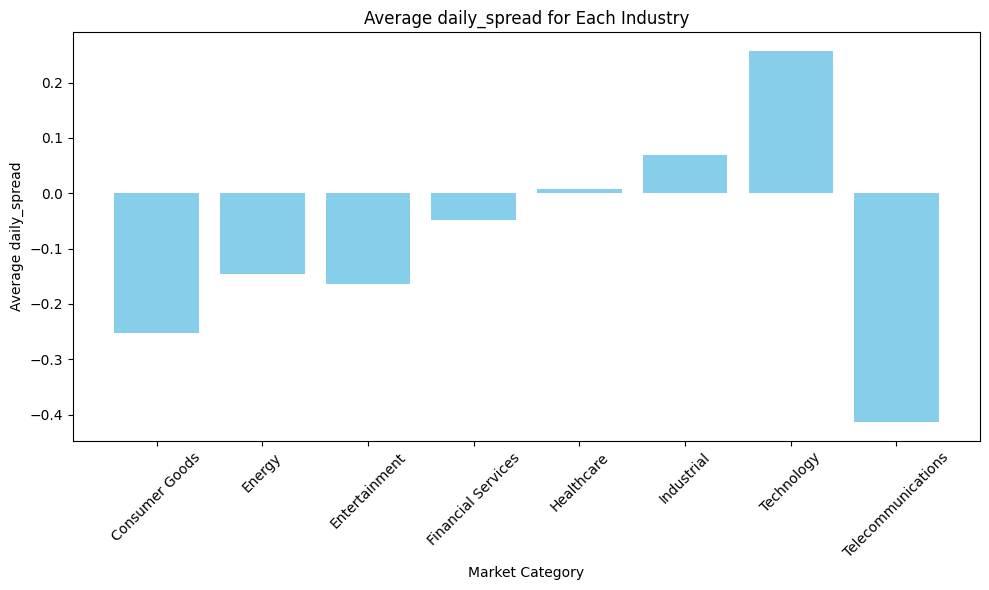

In [170]:
# Selecting comparable columns
comparable_columns = ['price', 'volume','return', 'high', 'low', 'open', 'avg_price', 'mkt_cap', 'pct_return', 'log_attention', 'daily_spread']

# Group by 'Market Category' and calculate the mean
mean_data = data.groupby('industry')[comparable_columns].mean()

# Plotting bar chart for each comparable column
for column in comparable_columns:
    plt.figure(figsize=(10, 6))
    plt.bar(mean_data.index, mean_data[column], color='skyblue')
    plt.title(f'Average {column} for Each Industry')
    plt.xlabel('Market Category')
    plt.ylabel(f'Average {column}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

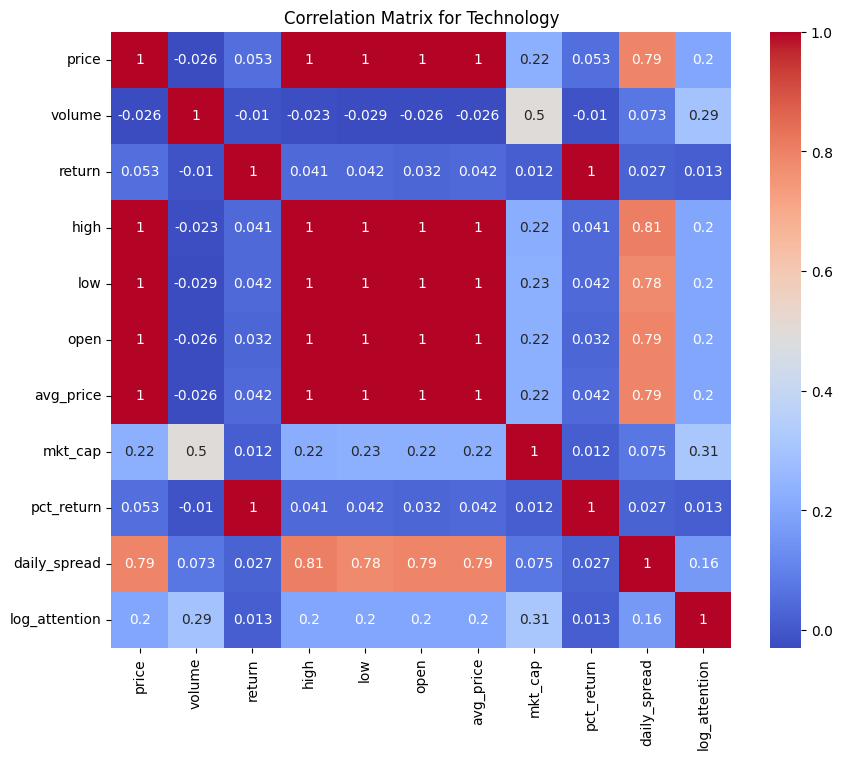

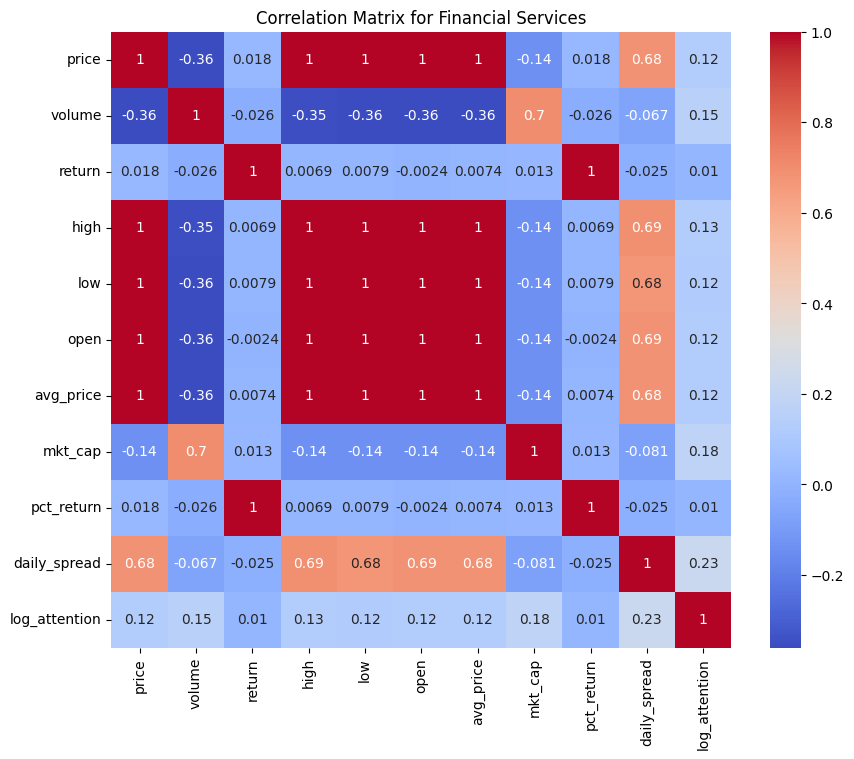

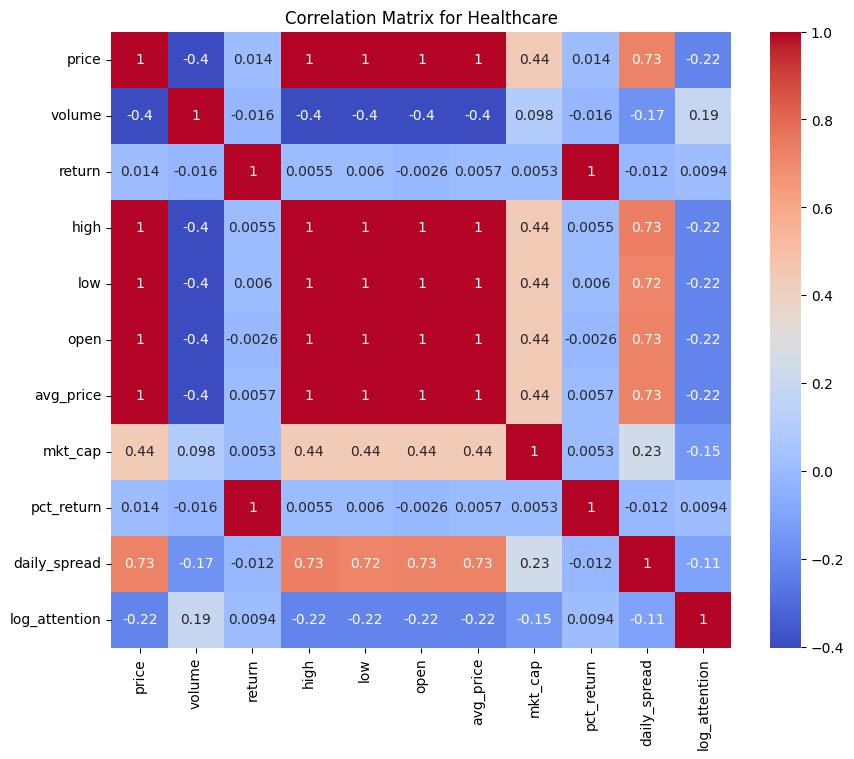

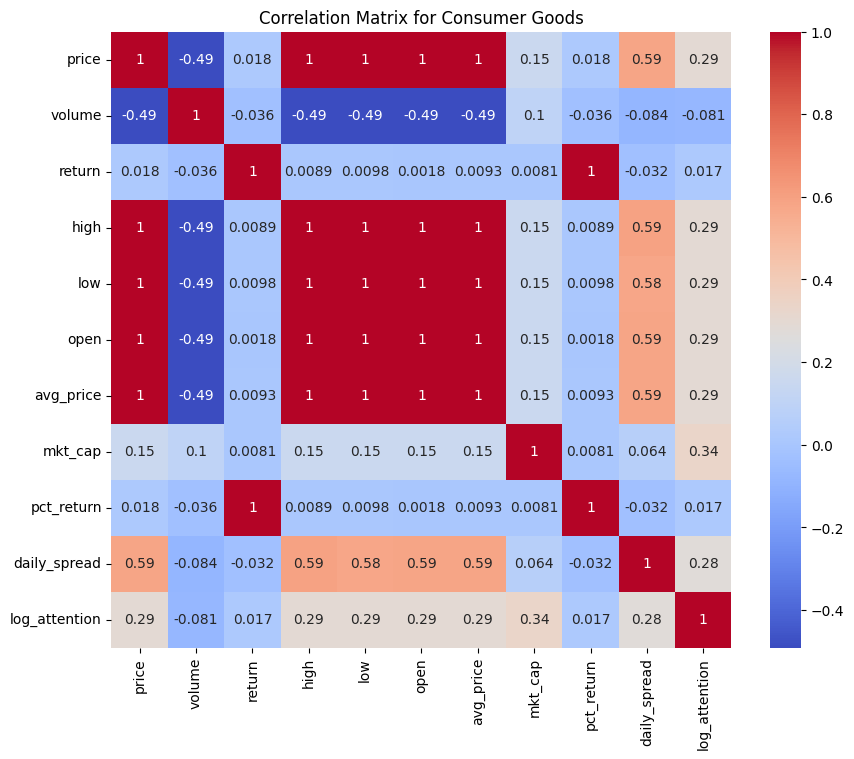

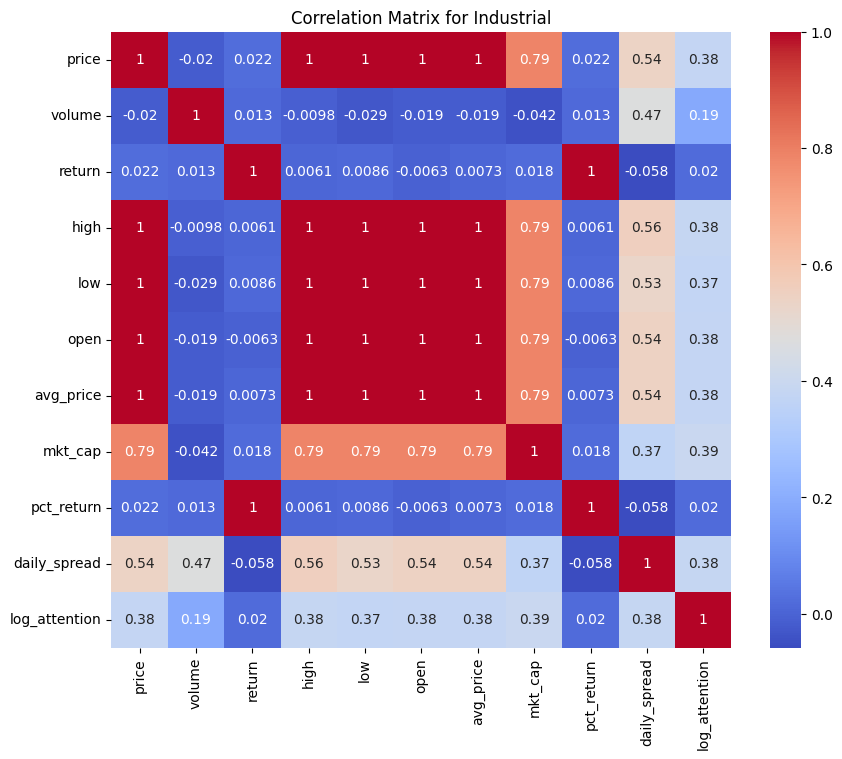

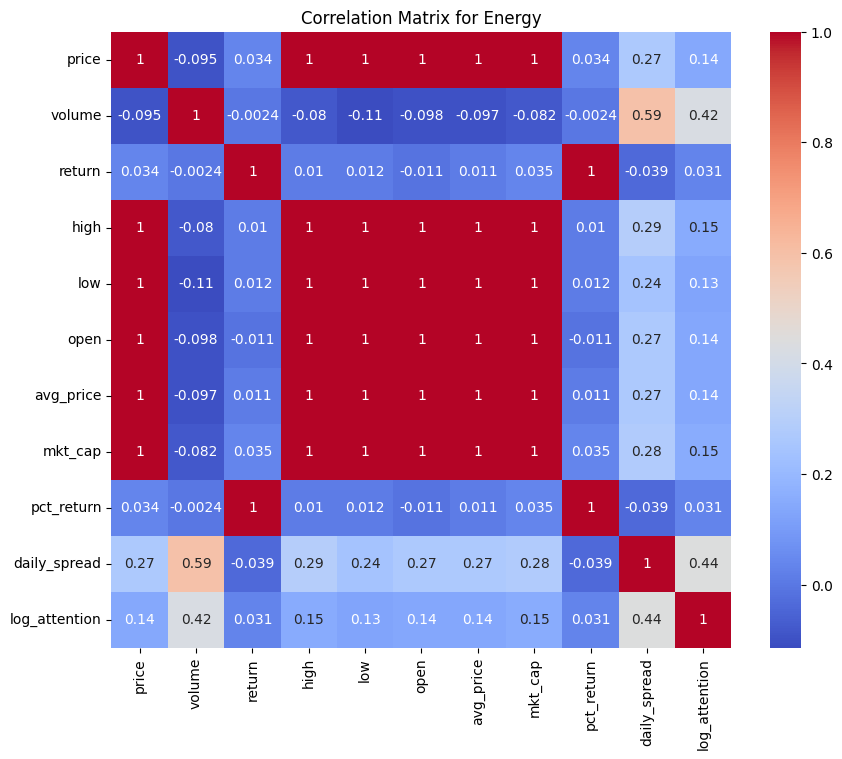

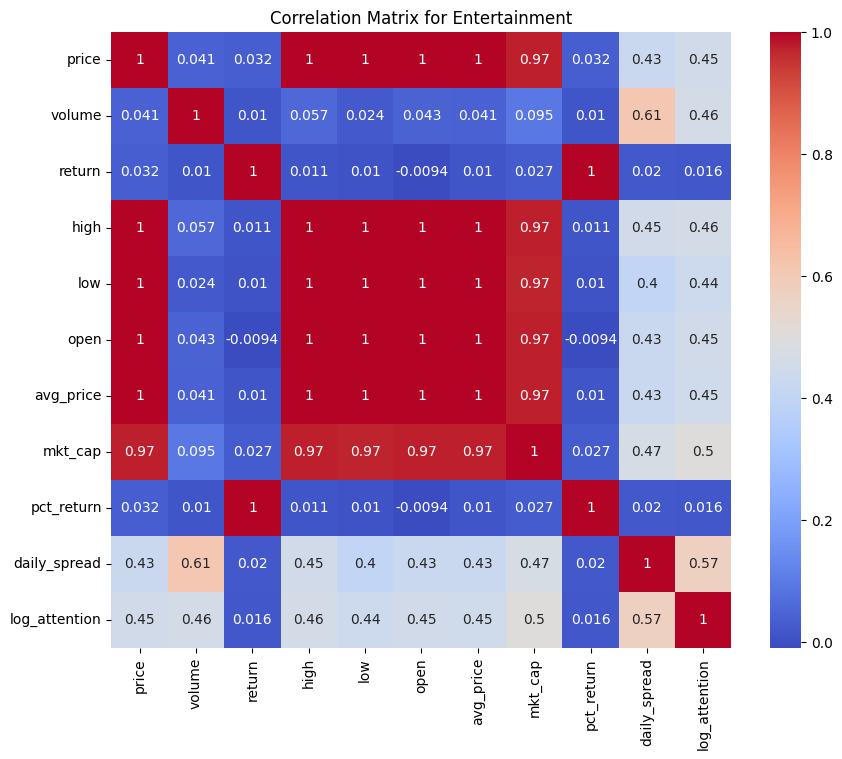

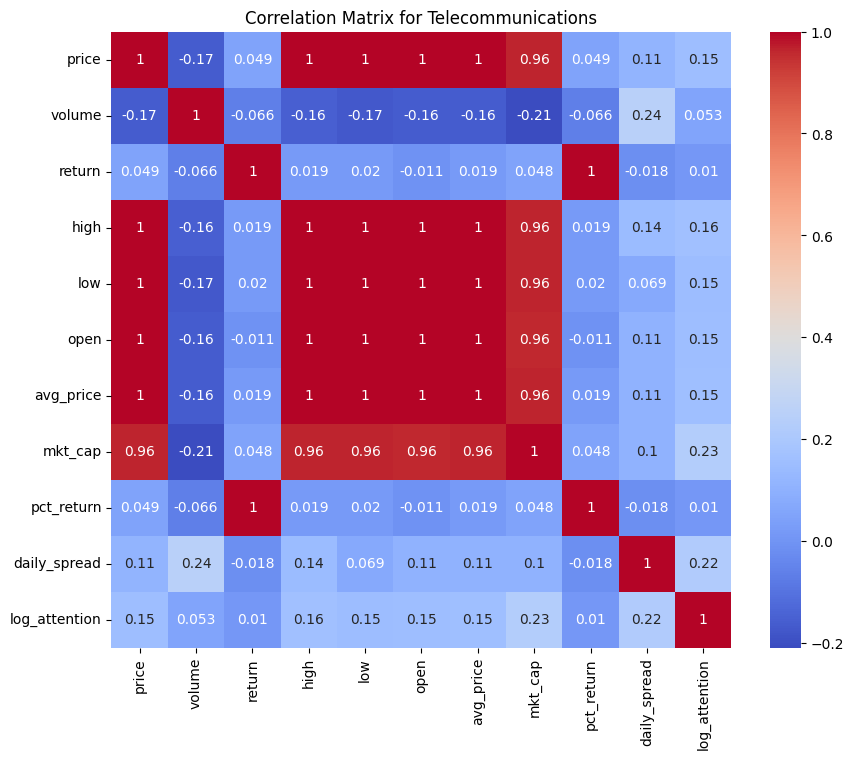

In [171]:
# Correlation Analysis
industries = data['industry'].unique()

#setting numerical variables:
numerical = ['price', 'volume', 'return', 'high', 'low', 'open', 'avg_price', 'mkt_cap', 'pct_return', 'daily_spread','log_attention']
correlation_matrix = data[numerical].corr()

#plotting the correlation matrix
for industry in industries:
    industry_data = data[data['industry'] == industry]
    correlation_matrix = industry_data[numerical].corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
    plt.title(f'Correlation Matrix for {industry}')
    plt.show()

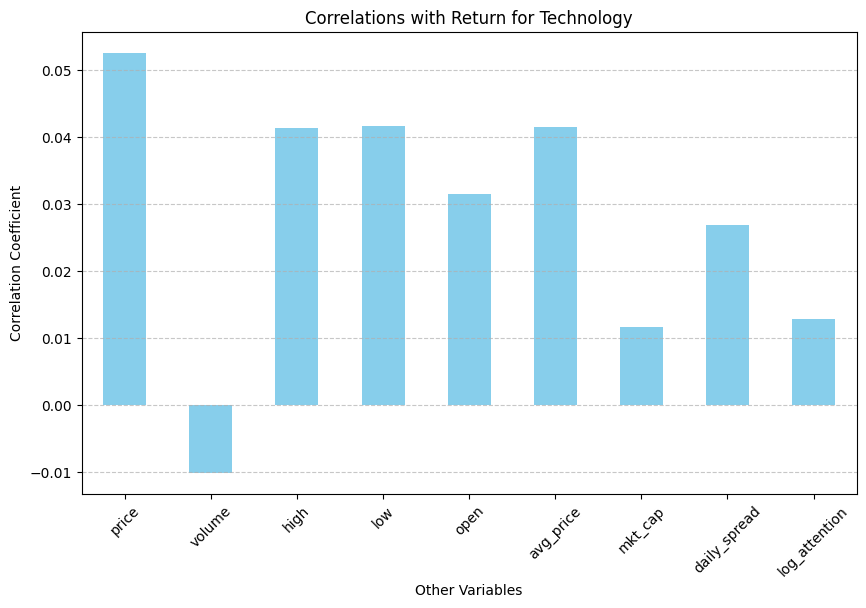

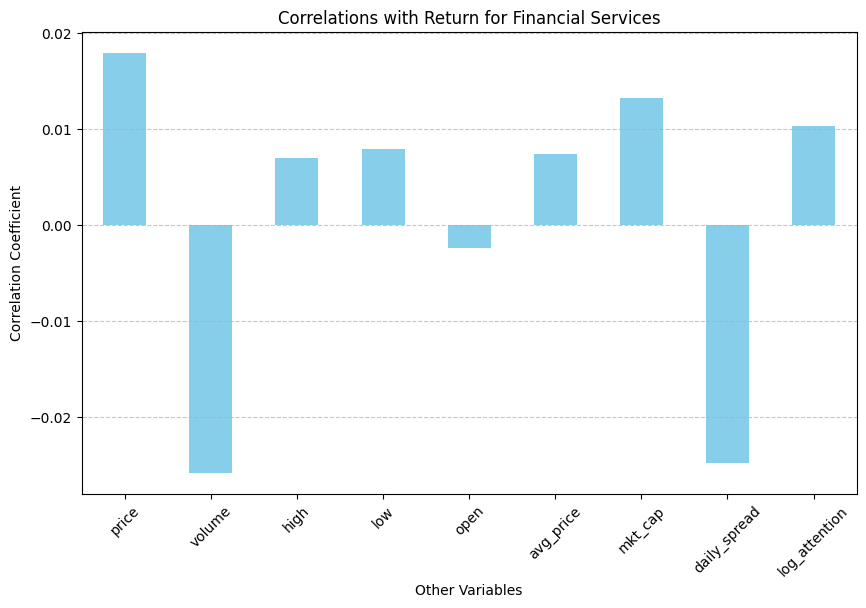

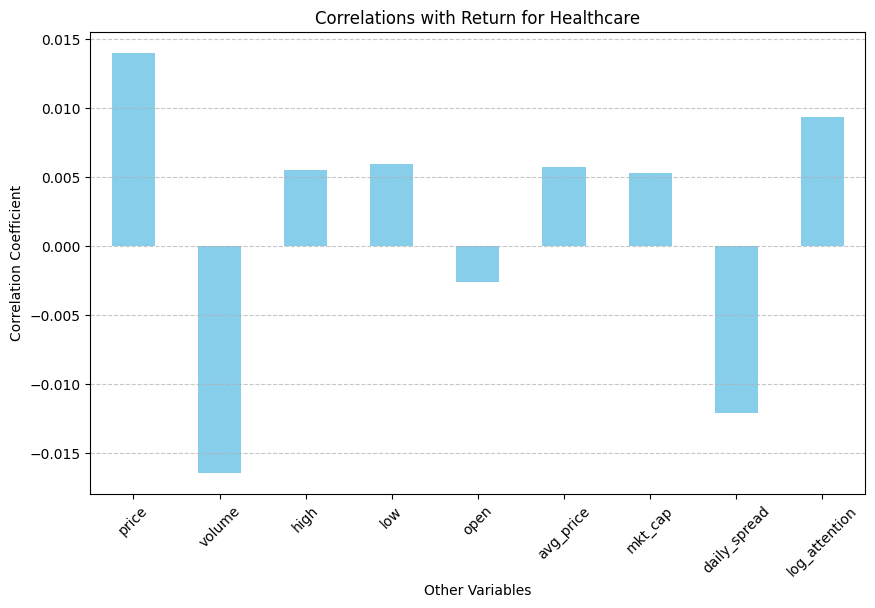

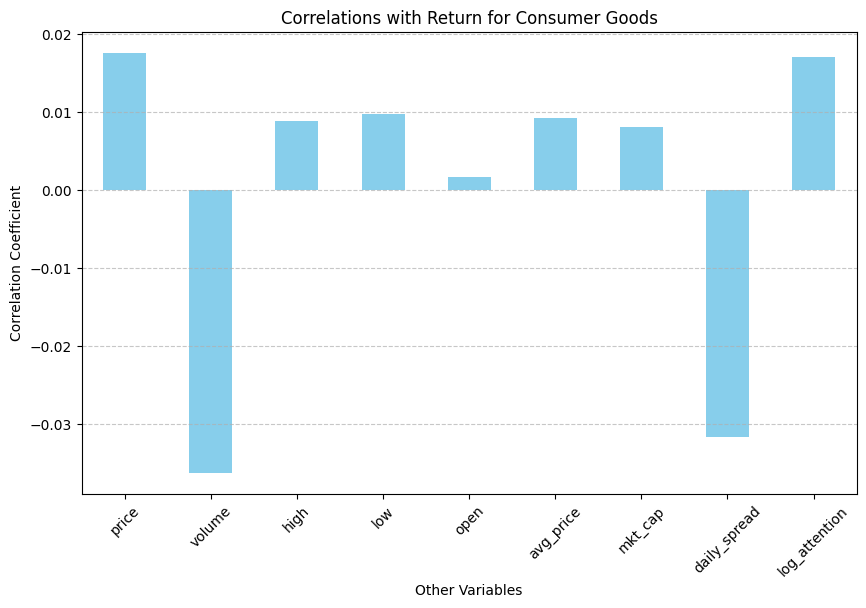

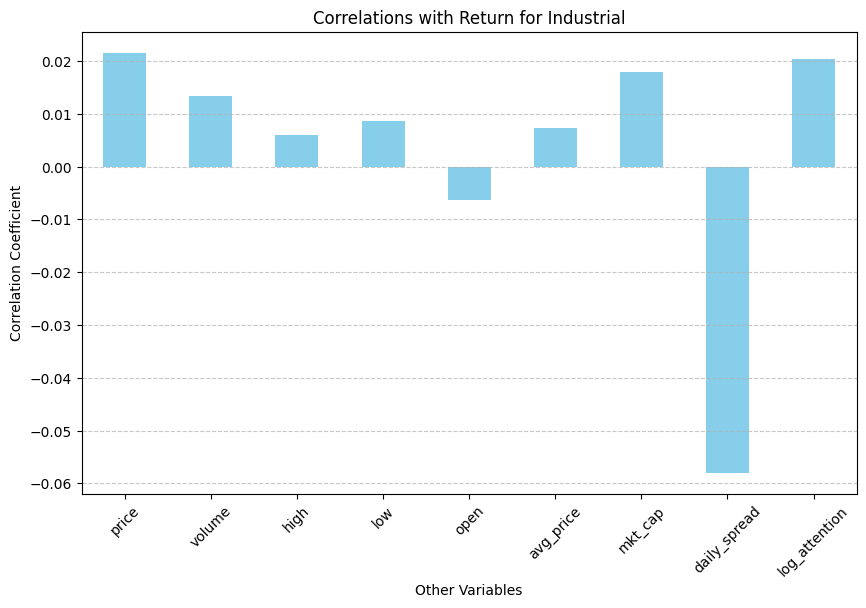

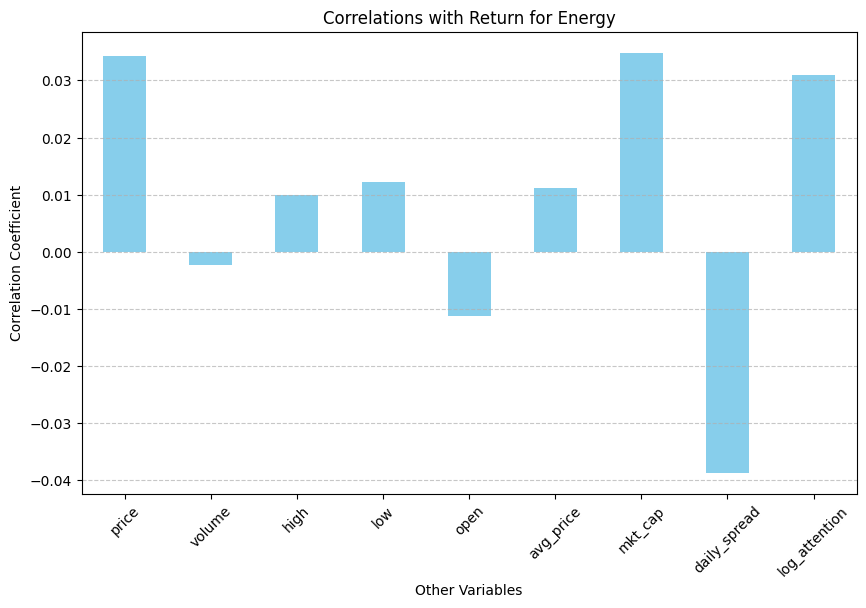

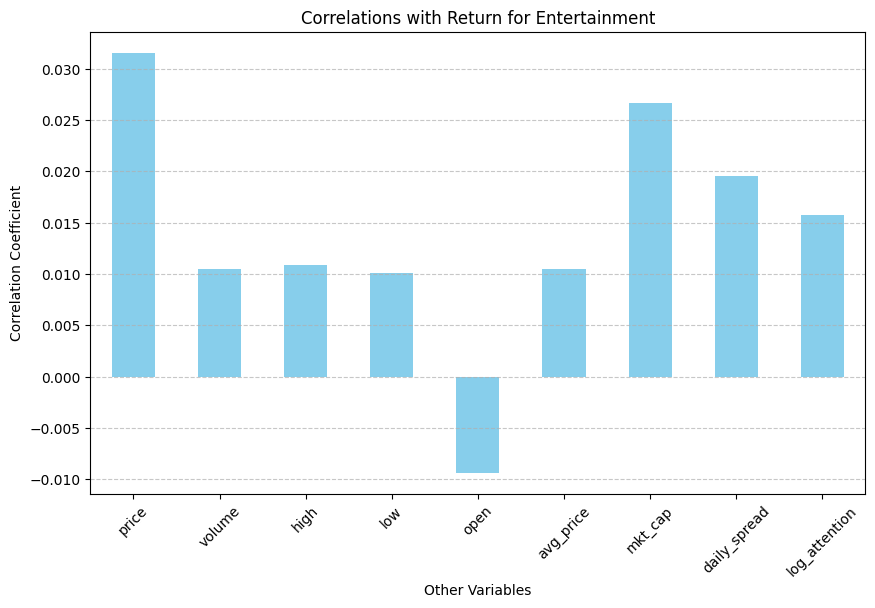

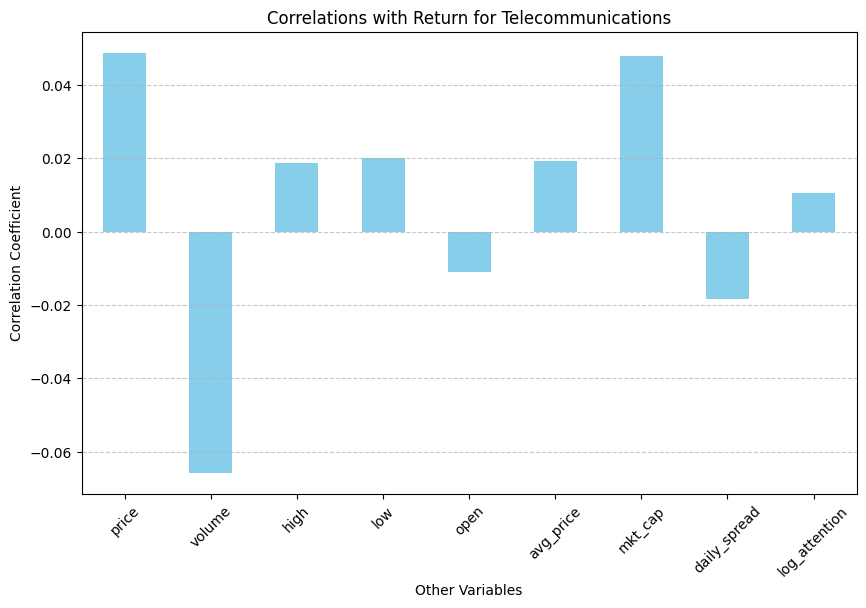

In [172]:
correlations = data[numerical].corr()['pct_return'].drop(['pct_return', 'return'])

for industry in industries:
    industry_data = data[data['industry'] == industry]
    #correlation_matrix = industry_data[numerical].corr()
    correlations = industry_data[numerical].corr()['pct_return'].drop(['pct_return', 'return'])
# Plot bar graph
    plt.figure(figsize=(10, 6))
    correlations.plot(kind='bar', color='skyblue')
    plt.title(f'Correlations with Return for {industry}')
    plt.xlabel('Other Variables')
    plt.ylabel('Correlation Coefficient')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


#### 1d. Larger Scale (Monthly, Quarterly and Yearly)

In [173]:
#Monthly Look
temp = data.copy()
temp['date'] = pd.to_datetime(temp['date'])

temp.set_index('date', inplace=True)

monthly_values = pd.DataFrame()

monthly_values['monthly_returns']= temp.groupby(['ticker', 'industry'])['pct_return'].resample('MS').mean()
monthly_values['monthly_attention']= temp.groupby(['ticker', 'industry'])['log_attention'].resample('MS').mean()


monthly_values.tail(10)

monthly_returns  monthly_attention
ticker industry       date                                          
WMT    Consumer Goods 2023-03-01         0.068708           2.928002
                      2023-04-01         0.037348           2.972106
                      2023-05-01        -0.096038           2.868540
                      2023-06-01         0.152276           3.064595
                      2023-07-01         0.015046           2.942673
                      2023-08-01         0.018036           2.868974
                      2023-09-01        -0.081677           2.964674
                      2023-10-01         0.023112           3.006198
                      2023-11-01        -0.156474           2.872350
                      2023-12-01         0.013636           2.942151

In [174]:
monthly_values.reset_index(inplace=True)


split_date = '2020-01-01'


monthly_values['Post-covid'] = (monthly_values['date'] >= split_date).astype(int)
#quarterly_values['Post-covid'] = (quarterly_values['date']  >= split_date).astype(int)

monthly_values


,ticker,industry,date,monthly_returns,monthly_attention,Post-covid
0,AAPL,Technology,2014-01-01,-0.333184,1.816194,0
1,AAPL,Technology,2014-02-01,0.137288,2.080379,0
2,AAPL,Technology,2014-03-01,0.020089,1.637839,0
3,AAPL,Technology,2014-04-01,0.236795,1.342101,0
4,AAPL,Technology,2014-05-01,0.174454,2.129477,0
...,...,...,...,...,...,...
3355,WMT,Consumer Goods,2023-08-01,0.018036,2.868974,1
3356,WMT,Consumer Goods,2023-09-01,-0.081677,2.964674,1
3357,WMT,Consumer Goods,2023-10-01,0.023112,3.006198,1
3358,WMT,Consumer Goods,2023-11-01,-0.156474,2.872350,1


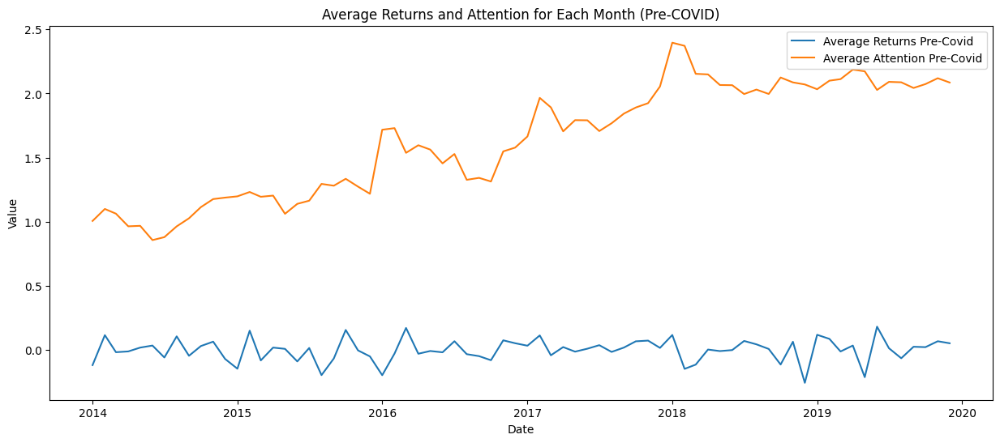

In [175]:
#Monthly Visualizations 
average_returns_pre_covid = monthly_values[monthly_values['Post-covid'] == 0].groupby('date')['monthly_returns'].mean()
average_attention_pre_covid = monthly_values[monthly_values['Post-covid'] == 0].groupby('date')['monthly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_pre_covid.index, average_returns_pre_covid, label='Average Returns Pre-Covid')
plt.plot(average_attention_pre_covid.index, average_attention_pre_covid, label='Average Attention Pre-Covid')

plt.title('Average Returns and Attention for Each Month (Pre-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


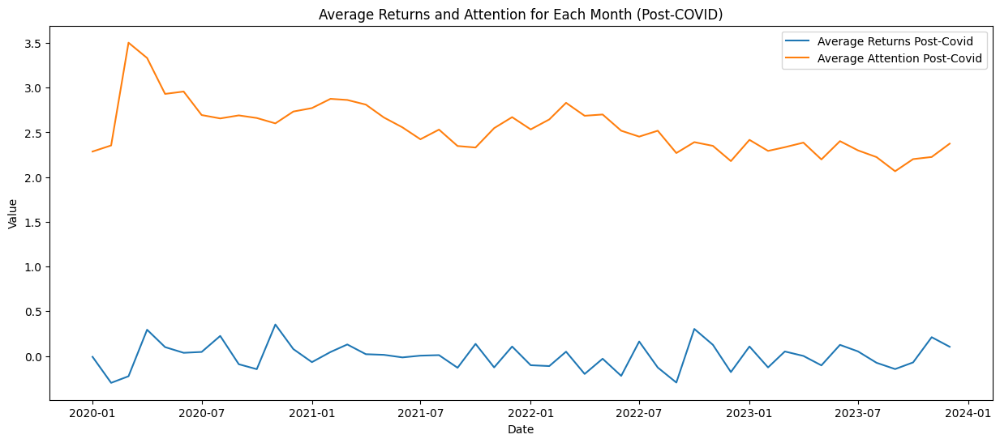

In [176]:
#Monthly Visualizations 
average_returns_post_covid = monthly_values[monthly_values['Post-covid'] == 1].groupby('date')['monthly_returns'].mean()
average_attention_post_covid = monthly_values[monthly_values['Post-covid'] == 1].groupby('date')['monthly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_post_covid.index, average_returns_post_covid, label='Average Returns Post-Covid')
plt.plot(average_attention_post_covid.index, average_attention_post_covid, label='Average Attention Post-Covid')

plt.title('Average Returns and Attention for Each Month (Post-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


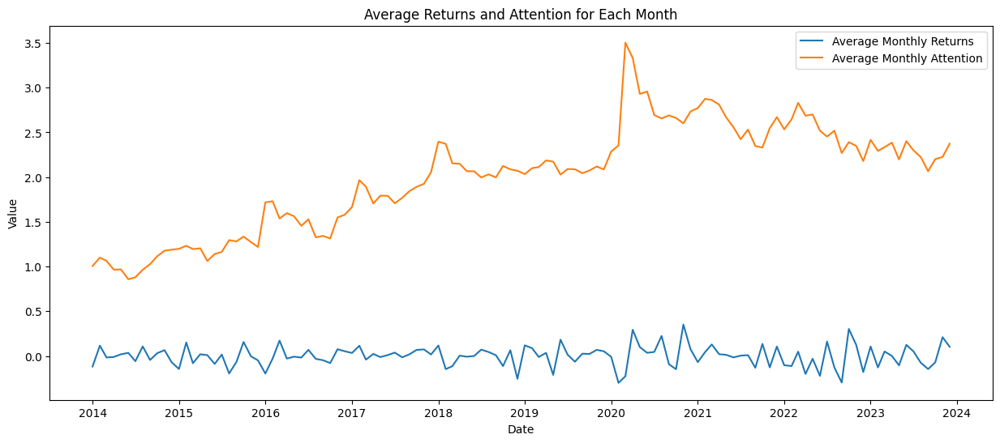

In [177]:
#Monthly Visualizations 
average_m_returns = monthly_values.groupby('date')['monthly_returns'].mean()
average_m_attention = monthly_values.groupby('date')['monthly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_m_returns.index, average_m_returns, label='Average Monthly Returns')
plt.plot(average_m_attention.index, average_m_attention, label='Average Monthly Attention')

plt.title('Average Returns and Attention for Each Month')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [178]:
#Quarterly Look

quarterly_values = pd.DataFrame()

quarterly_values['quarterly_returns']= temp.groupby(['ticker', 'industry'])['pct_return'].resample('QS').mean()
quarterly_values['quarterly_attention']= temp.groupby(['ticker', 'industry'])['log_attention'].resample('QS').mean()


quarterly_values.tail(10)

quarterly_returns  quarterly_attention
ticker industry       date                                              
WMT    Consumer Goods 2021-07-01          -0.041113             3.160054
                      2021-10-01           0.005417             3.089508
                      2022-01-01          -0.000779             2.957147
                      2022-04-01          -0.205682             3.138195
                      2022-07-01           0.035449             2.888652
                      2022-10-01           0.055283             3.027920
                      2023-01-01           0.007775             2.927677
                      2023-04-01           0.028945             2.966684
                      2023-07-01          -0.014568             2.922751
                      2023-10-01          -0.039758             2.941250

In [179]:
quarterly_values.reset_index(inplace=True)


split_date = '2020-01-01'


quarterly_values['Post-covid'] = (quarterly_values['date'] >= split_date).astype(int)
#quarterly_values['Post-covid'] = (quarterly_values['date']  >= split_date).astype(int)

quarterly_values


,ticker,industry,date,quarterly_returns,quarterly_attention,Post-covid
0,AAPL,Technology,2014-01-01,-0.065025,1.837080,0
1,AAPL,Technology,2014-04-01,0.150962,1.878057,0
2,AAPL,Technology,2014-07-01,0.046283,2.388087,0
3,AAPL,Technology,2014-10-01,0.055415,2.547756,0
4,AAPL,Technology,2015-01-01,0.089938,2.293281,0
...,...,...,...,...,...,...
1115,WMT,Consumer Goods,2022-10-01,0.055283,3.027920,1
1116,WMT,Consumer Goods,2023-01-01,0.007775,2.927677,1
1117,WMT,Consumer Goods,2023-04-01,0.028945,2.966684,1
1118,WMT,Consumer Goods,2023-07-01,-0.014568,2.922751,1


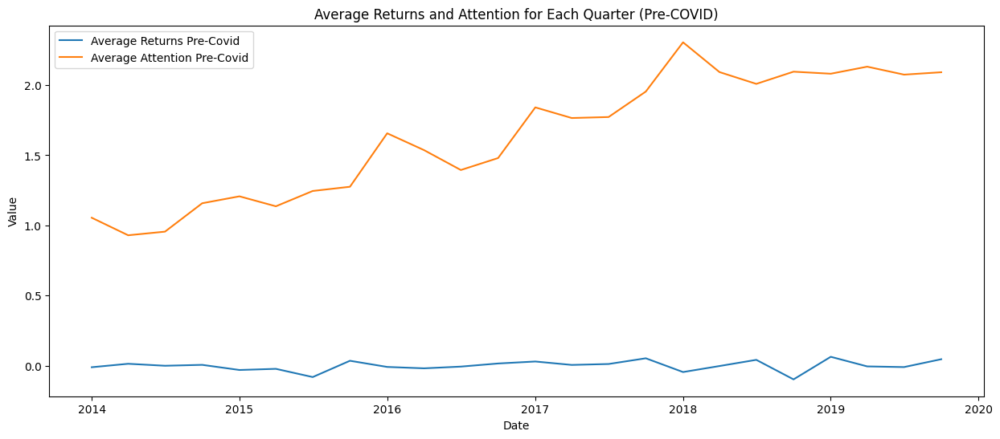

In [180]:
#Quarterly Visualizations 
average_returns_pre_covid = quarterly_values[quarterly_values['Post-covid'] == 0].groupby('date')['quarterly_returns'].mean()
average_attention_pre_covid = quarterly_values[quarterly_values['Post-covid'] == 0].groupby('date')['quarterly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_pre_covid.index, average_returns_pre_covid, label='Average Returns Pre-Covid')
plt.plot(average_attention_pre_covid.index, average_attention_pre_covid, label='Average Attention Pre-Covid')

plt.title('Average Returns and Attention for Each Quarter (Pre-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


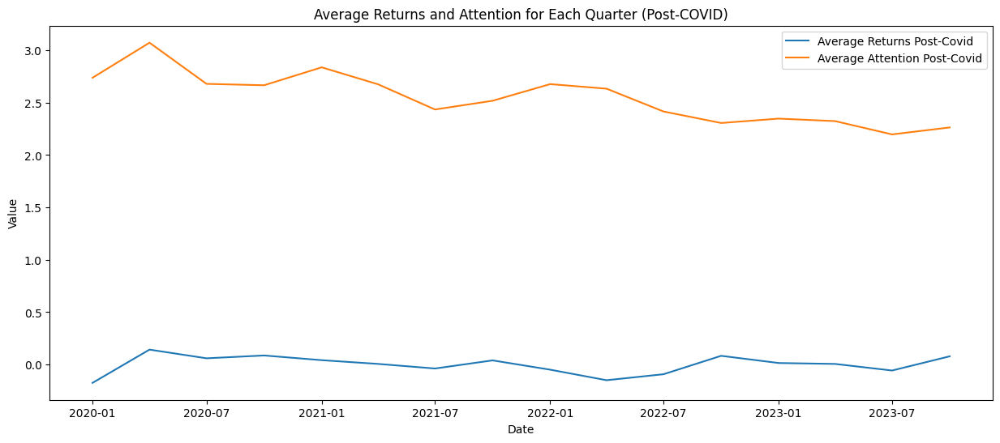

In [181]:
#Quarterly Visualizations 
average_returns_post_covid = quarterly_values[quarterly_values['Post-covid'] == 1].groupby('date')['quarterly_returns'].mean()
average_attention_post_covid = quarterly_values[quarterly_values['Post-covid'] == 1].groupby('date')['quarterly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_post_covid.index, average_returns_post_covid, label='Average Returns Post-Covid')
plt.plot(average_attention_post_covid.index, average_attention_post_covid, label='Average Attention Post-Covid')

plt.title('Average Returns and Attention for Each Quarter (Post-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

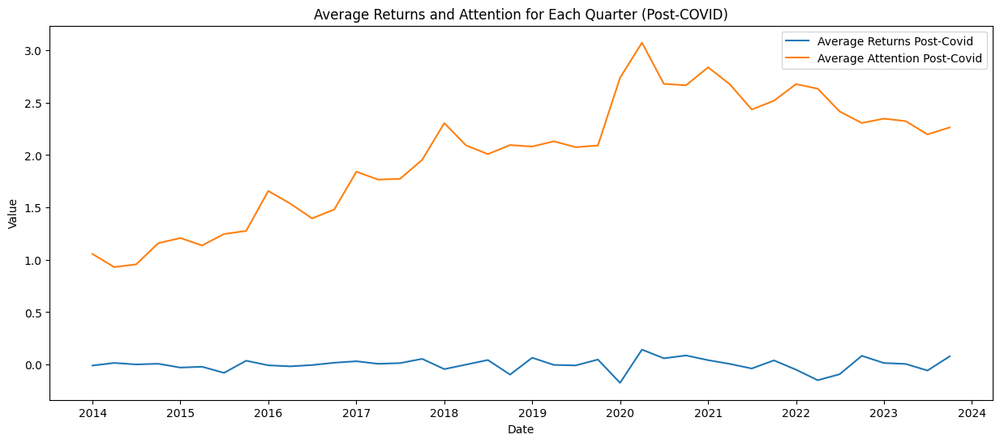

In [182]:
#Quarterly Visualizations 
average_q_returns = quarterly_values.groupby('date')['quarterly_returns'].mean()
average_q_attention = quarterly_values.groupby('date')['quarterly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_q_returns.index, average_q_returns, label='Average Returns Post-Covid')
plt.plot(average_q_attention.index, average_q_attention, label='Average Attention Post-Covid')

plt.title('Average Returns and Attention for Each Quarter (Post-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [183]:
# Yearly Look

yearly_values = pd.DataFrame()

yearly_values['yearly_returns']= temp.groupby(['ticker', 'industry'])['pct_return'].resample('YS').mean()
yearly_values['yearly_attention']= temp.groupby(['ticker', 'industry'])['log_attention'].resample('YS').mean()


yearly_values.tail(10)


yearly_returns  yearly_attention
ticker industry       date                                        
WMT    Consumer Goods 2014-01-01       -0.007706          1.543880
                      2015-01-01       -0.100912          2.038383
                      2016-01-01        0.002816          2.229353
                      2017-01-01        0.055942          2.720080
                      2018-01-01       -0.036690          3.075923
                      2019-01-01        0.027199          3.076141
                      2020-01-01        0.023485          3.426226
                      2021-01-01       -0.027622          3.239349
                      2022-01-01       -0.028084          3.002167
                      2023-01-01       -0.004584          2.939530

In [184]:
yearly_values.reset_index(inplace=True)


split_date = '2020-01-01'


yearly_values['Post-covid'] = (yearly_values['date'] >= split_date).astype(int)
#quarterly_values['Post-covid'] = (quarterly_values['date']  >= split_date).astype(int)

yearly_values


,ticker,industry,date,yearly_returns,yearly_attention,Post-covid
0,AAPL,Technology,2014-01-01,0.047828,2.167752,0
1,AAPL,Technology,2015-01-01,-0.034132,2.354831,0
2,AAPL,Technology,2016-01-01,-0.002250,2.401352,0
3,AAPL,Technology,2017-01-01,0.058769,2.688959,0
4,AAPL,Technology,2018-01-01,-0.038557,2.901960,0
...,...,...,...,...,...,...
275,WMT,Consumer Goods,2019-01-01,0.027199,3.076141,0
276,WMT,Consumer Goods,2020-01-01,0.023485,3.426226,1
277,WMT,Consumer Goods,2021-01-01,-0.027622,3.239349,1
278,WMT,Consumer Goods,2022-01-01,-0.028084,3.002167,1


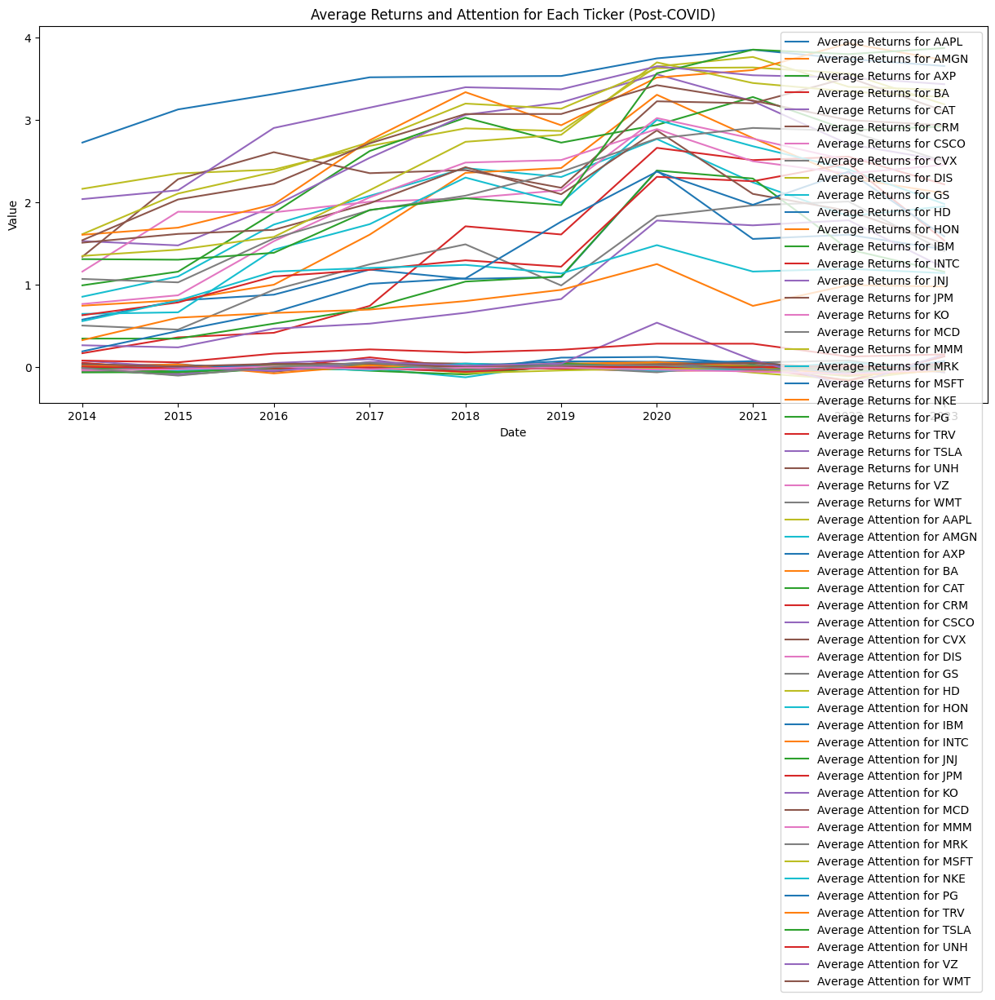

In [185]:
#Yearly Visualizations

# Group by both 'date' and 'ticker' to calculate mean yearly returns and attention for each ticker
average_y_returns = yearly_values.groupby(['date', 'ticker'])['yearly_returns'].mean()
average_y_attention = yearly_values.groupby(['date', 'ticker'])['yearly_attention'].mean()

# Plotting for each ticker
fig, ax = plt.subplots(figsize=(15, 6))
for ticker, group in average_y_returns.groupby(level='ticker'):
    ax.plot(group.index.get_level_values('date'), group.values, label=f'Average Returns for {ticker}')
    
for ticker, group in average_y_attention.groupby(level='ticker'):
    ax.plot(group.index.get_level_values('date'), group.values, label=f'Average Attention for {ticker}')

plt.title('Average Returns and Attention for Each Ticker (Post-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


### 2. Distributions of Independent Variables

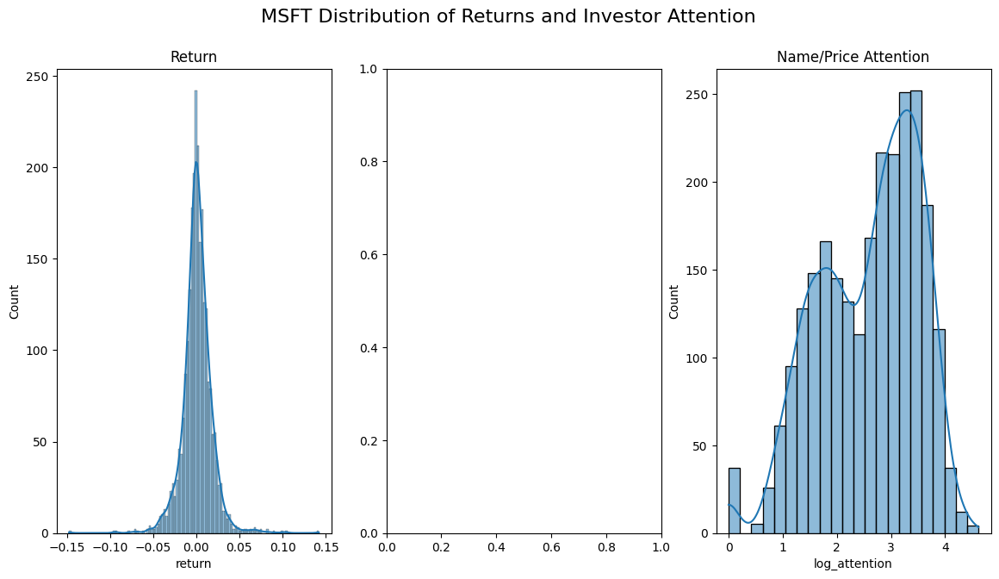

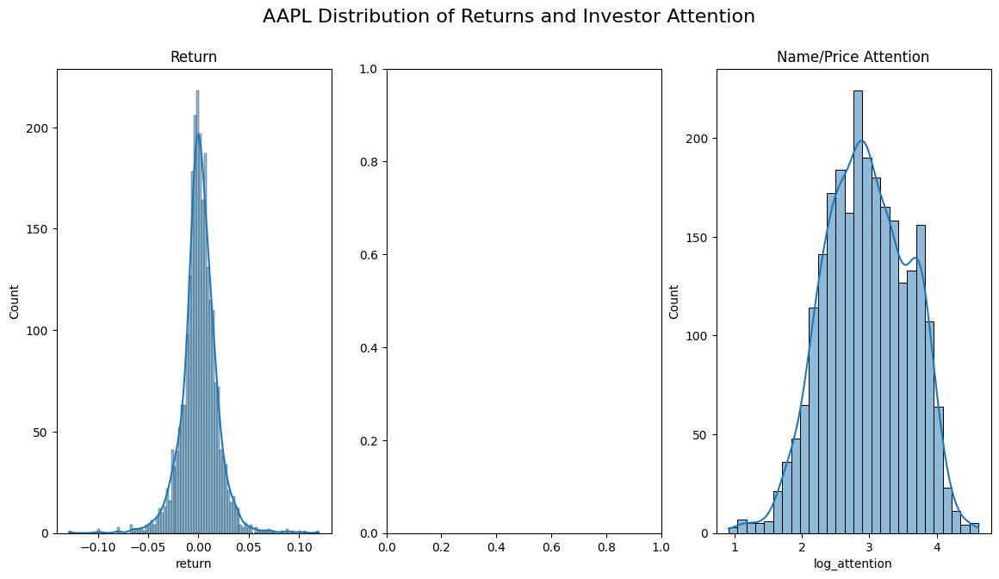

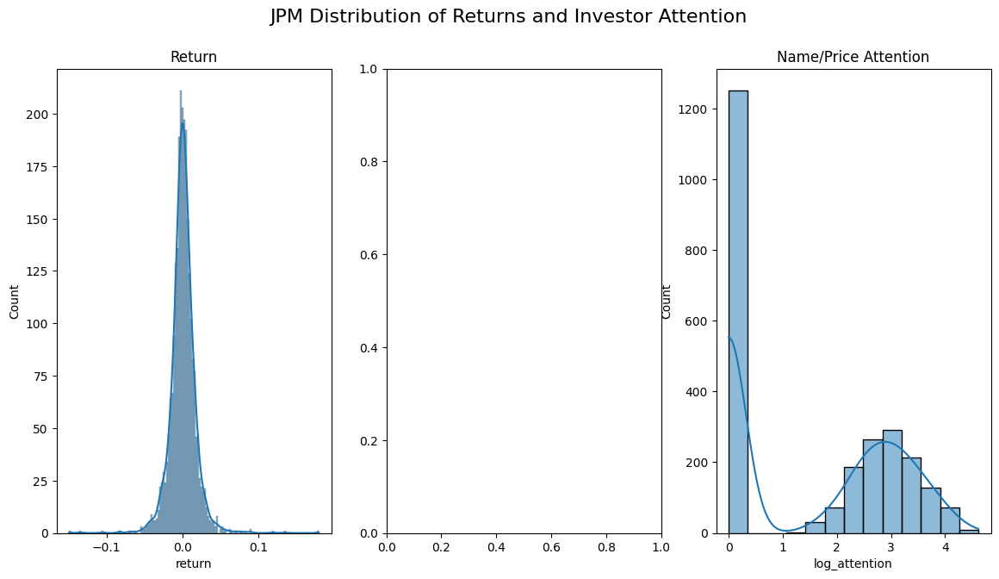

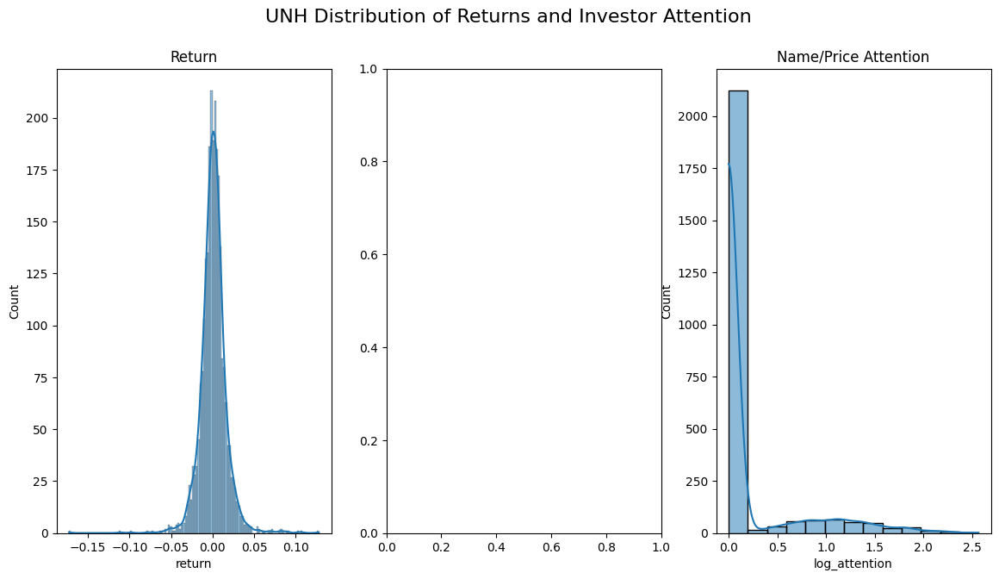

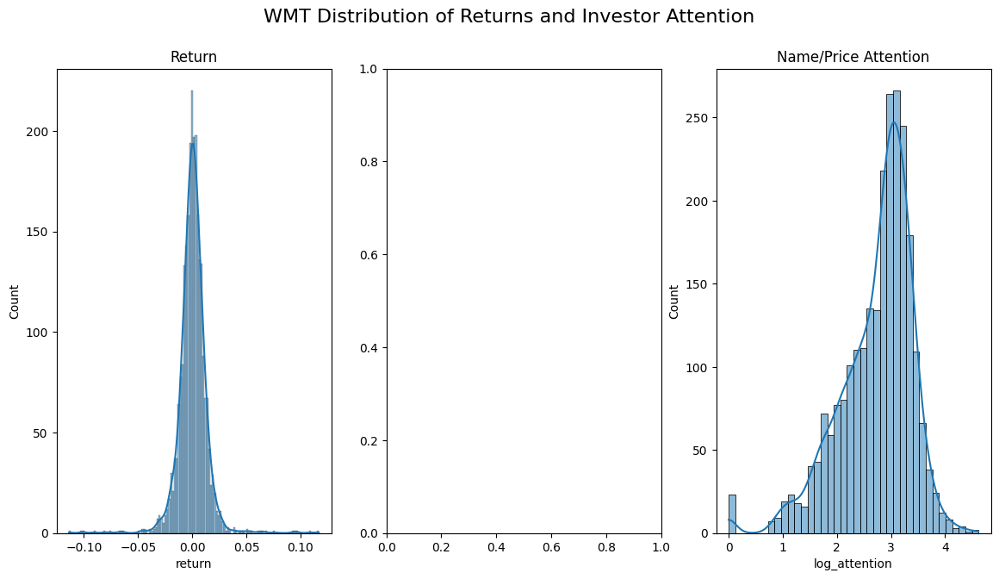

...

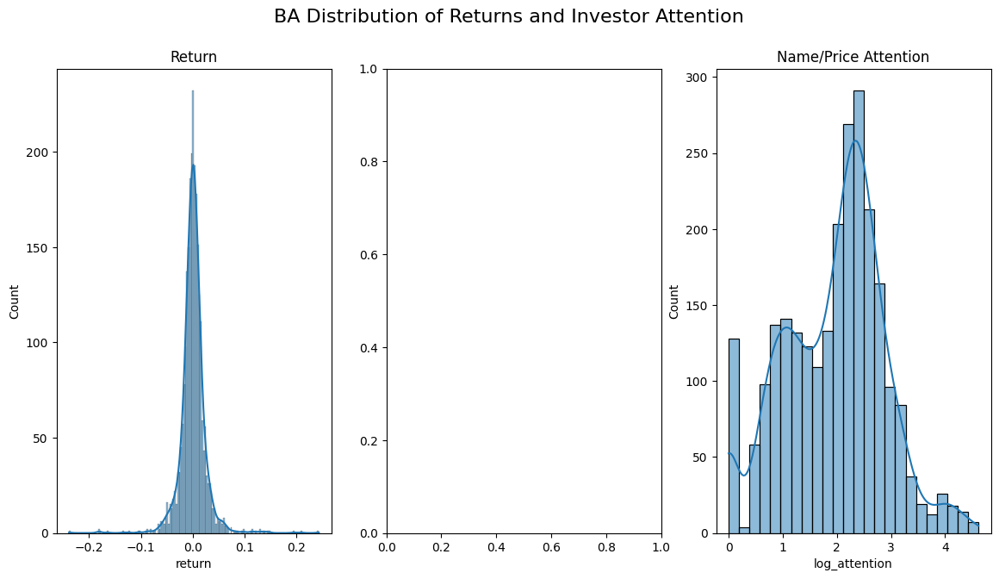

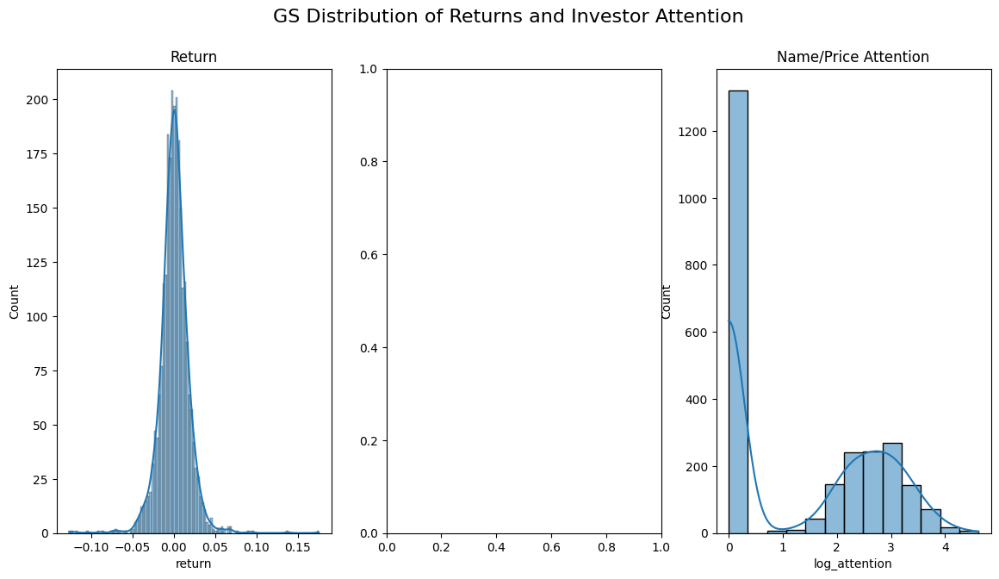

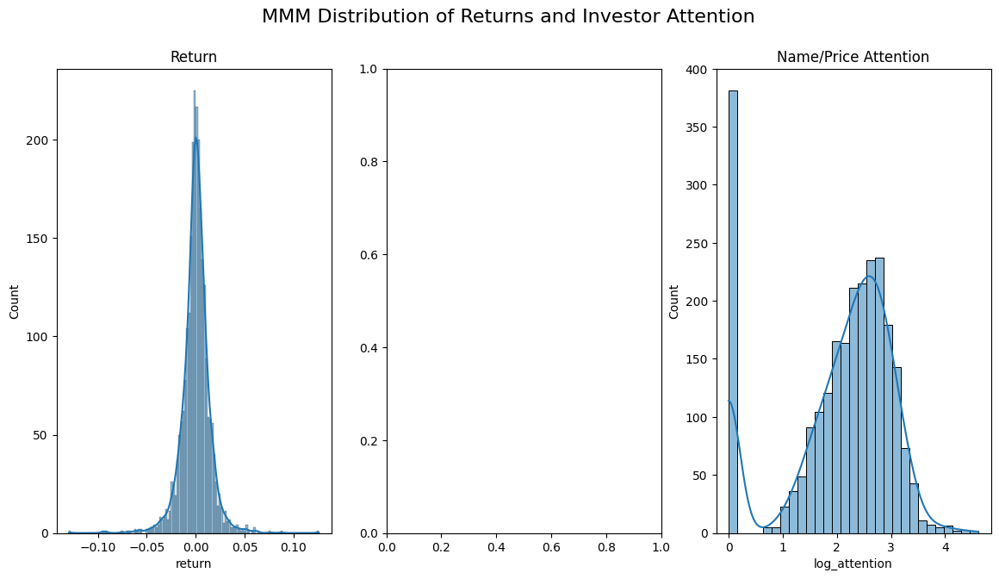

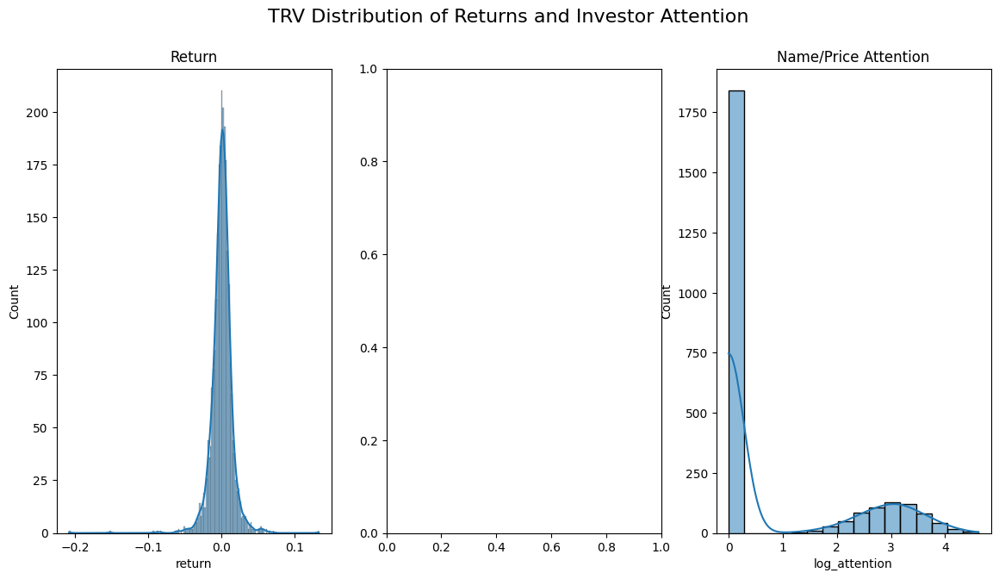

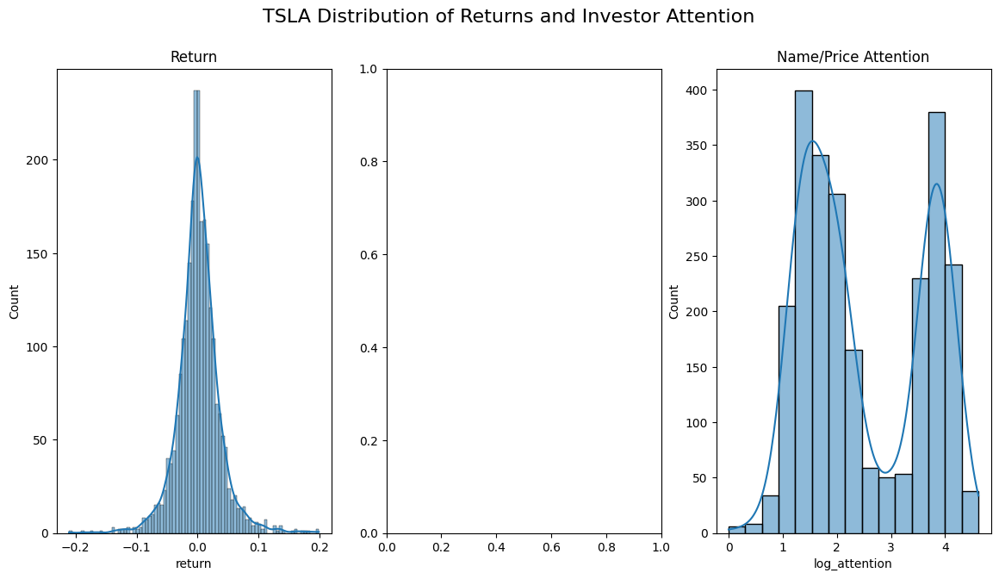

In [186]:
for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax = plt.subplots(1, 3, figsize=(14, 7))
    fig.suptitle(f'{stock} Distribution of Returns and Investor Attention', fontsize=16)
    sns.histplot(stock_data['return'], kde=True, ax=ax[0])
    ax[0].set_title('Return')
    sns.histplot(stock_data['log_attention'], kde=True, ax=ax[2])
    ax[2].set_title('Name/Price Attention')
    plt.show()



### 3. Scatter plots with the Relationships 

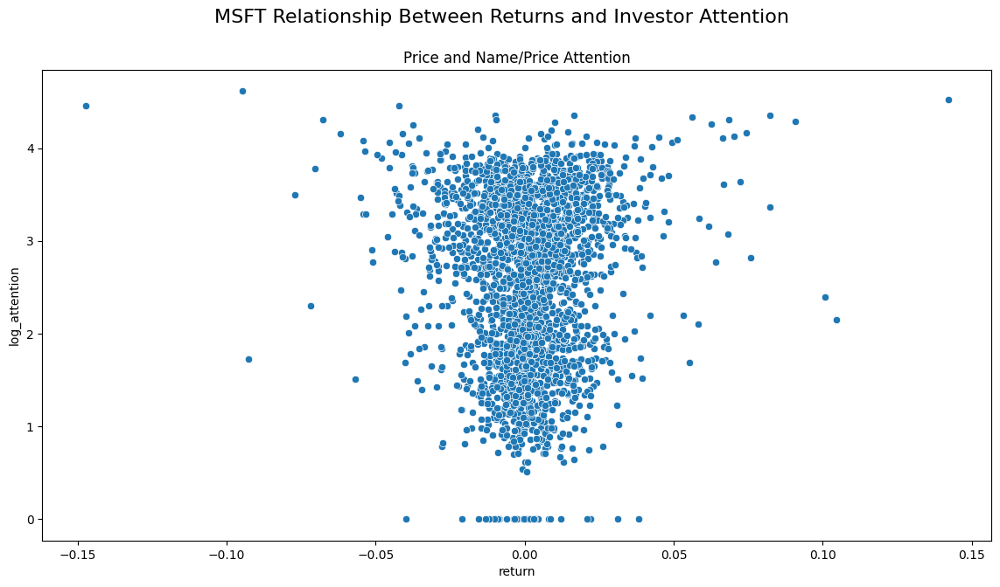

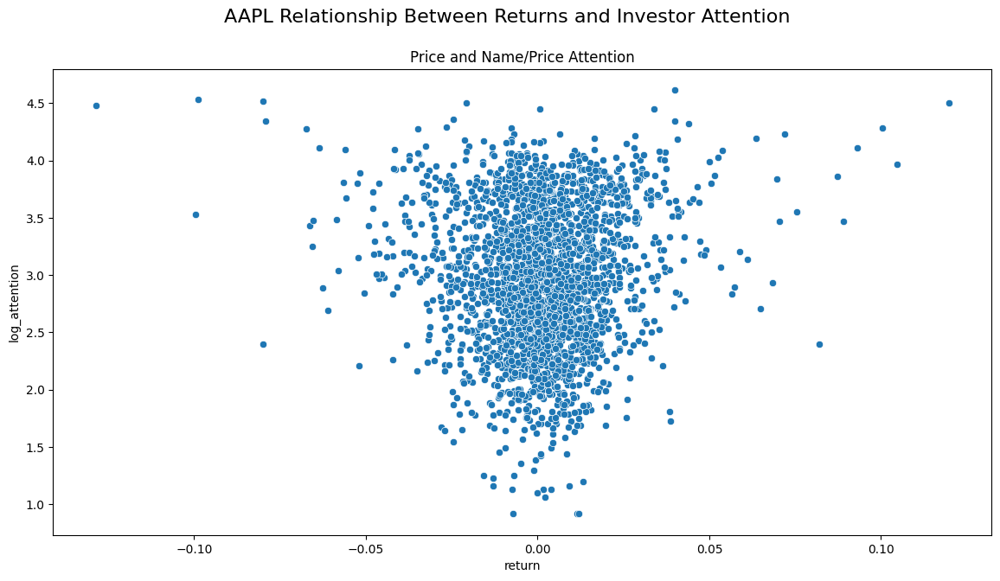

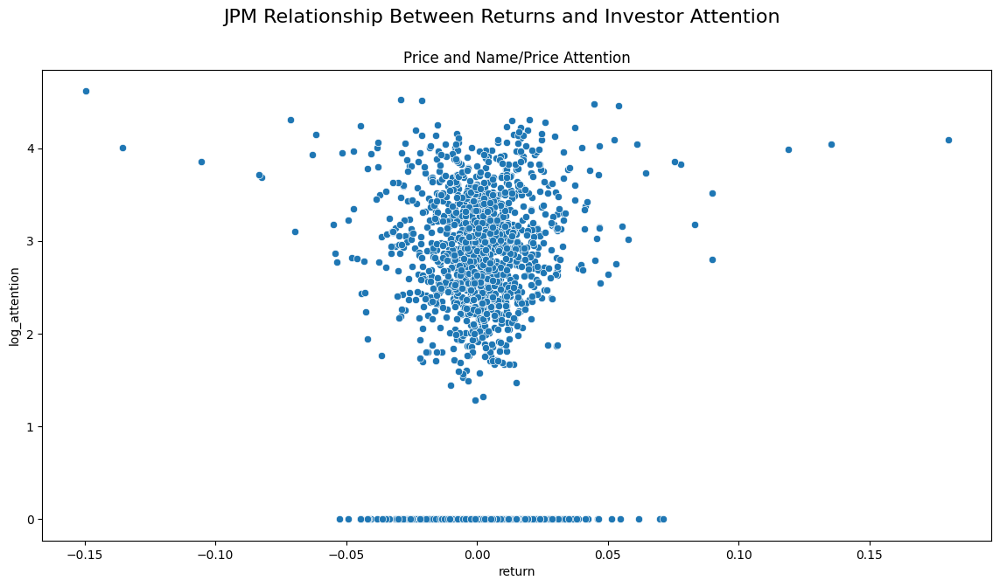

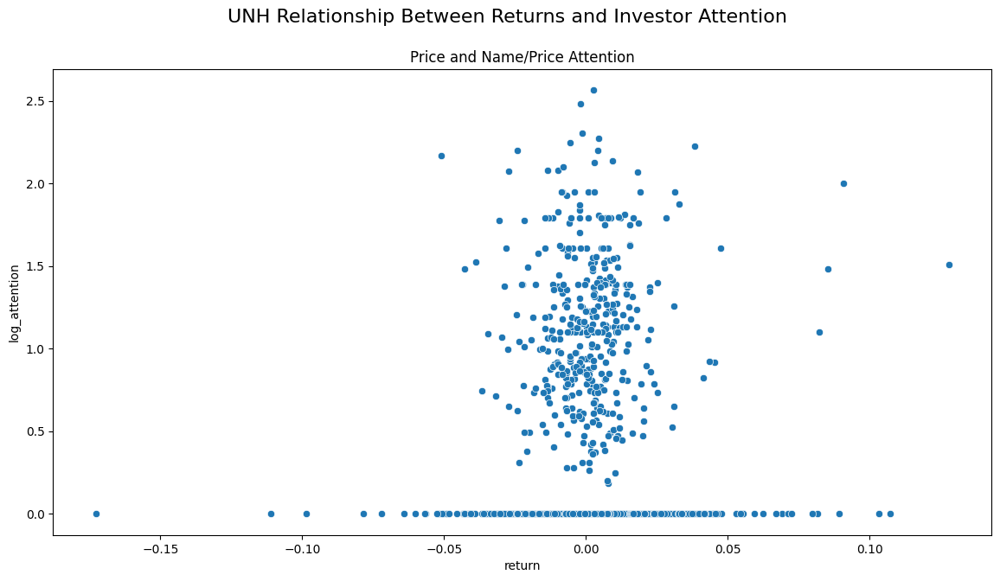

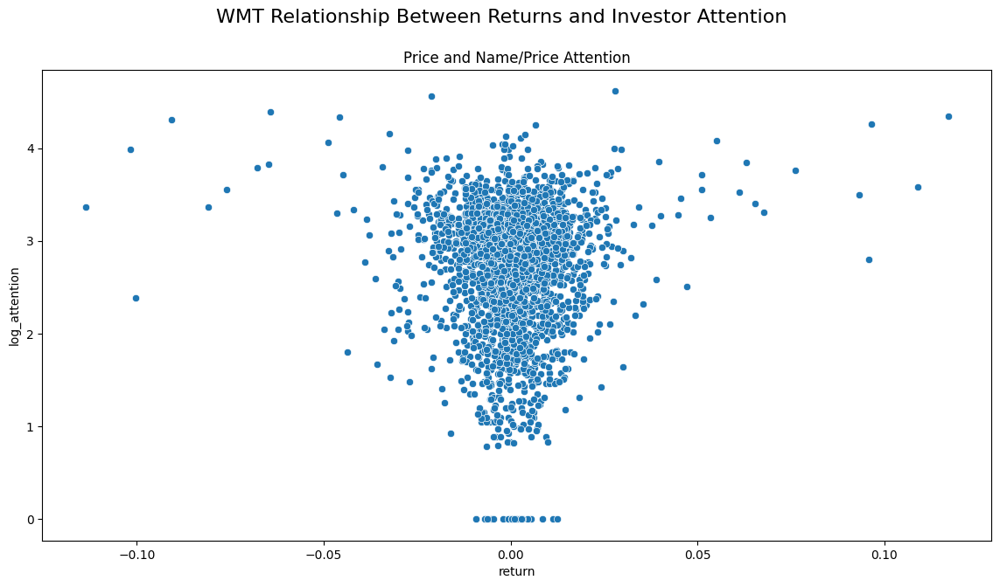

...

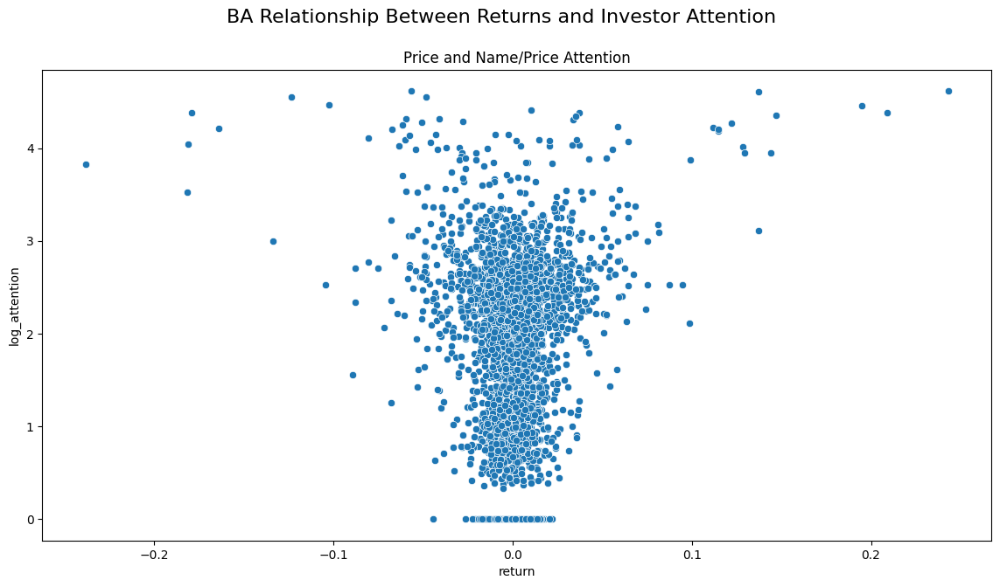

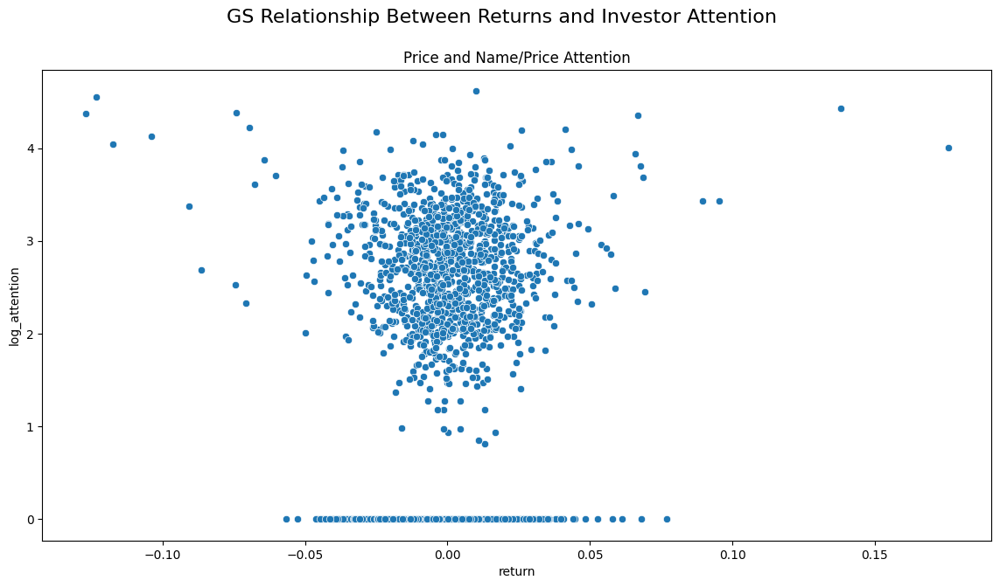

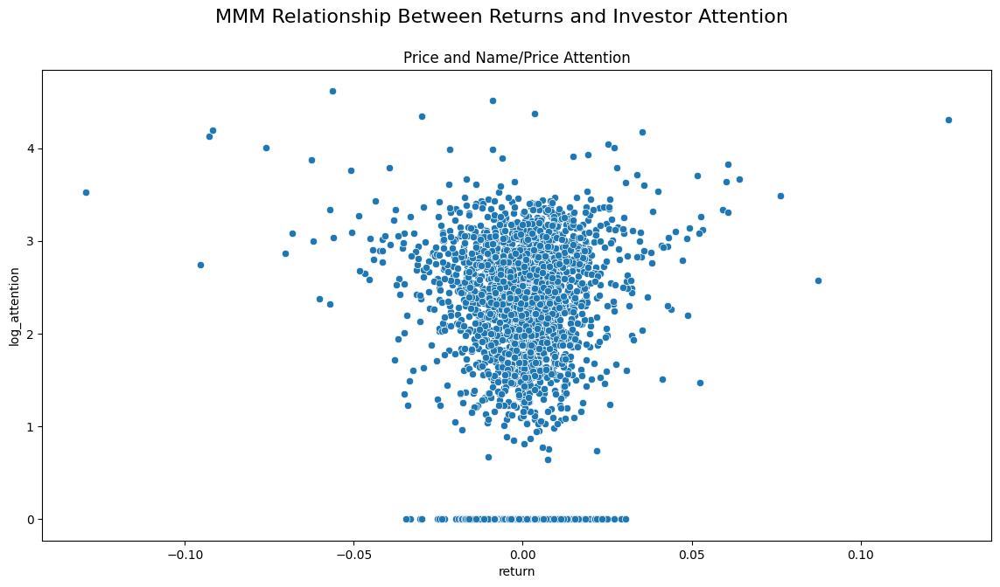

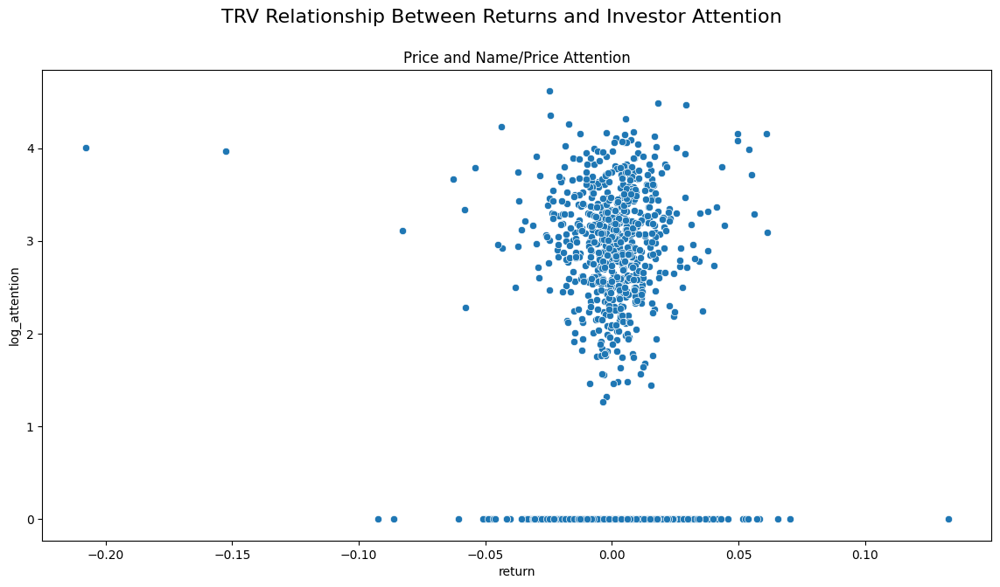

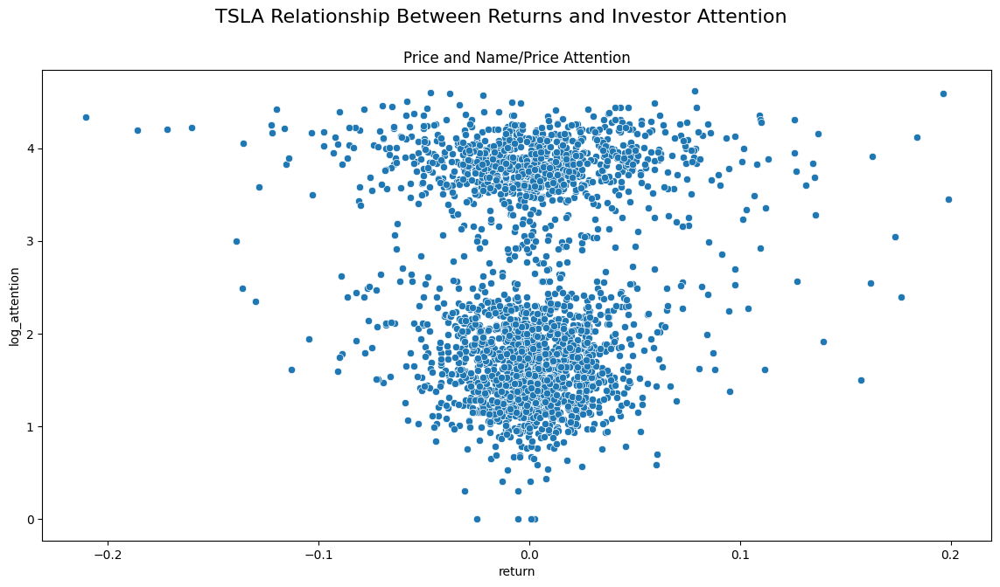

In [187]:
for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax = plt.subplots(1, figsize=(14, 7))
    fig.suptitle(f'{stock} Relationship Between Returns and Investor Attention', fontsize=16)
    sns.scatterplot(x=stock_data['return'], y=stock_data['log_attention'], ax=ax)
    ax.set_title('Price and Name/Price Attention')
    plt.show()

### Scaled vs Unscaled Data

In [198]:
unscaled = pd.read_csv("stocks_combined_unscaled.csv", index_col=0)
unscaled['daily_spread'] = unscaled['high'] - unscaled['low']
unscaled= unscaled.drop(columns=['permno'])

numerical = ['price', 'volume', 'return', 'high', 'low', 'open', 'avg_price', 'mkt_cap', 'pct_return', 'daily_spread']


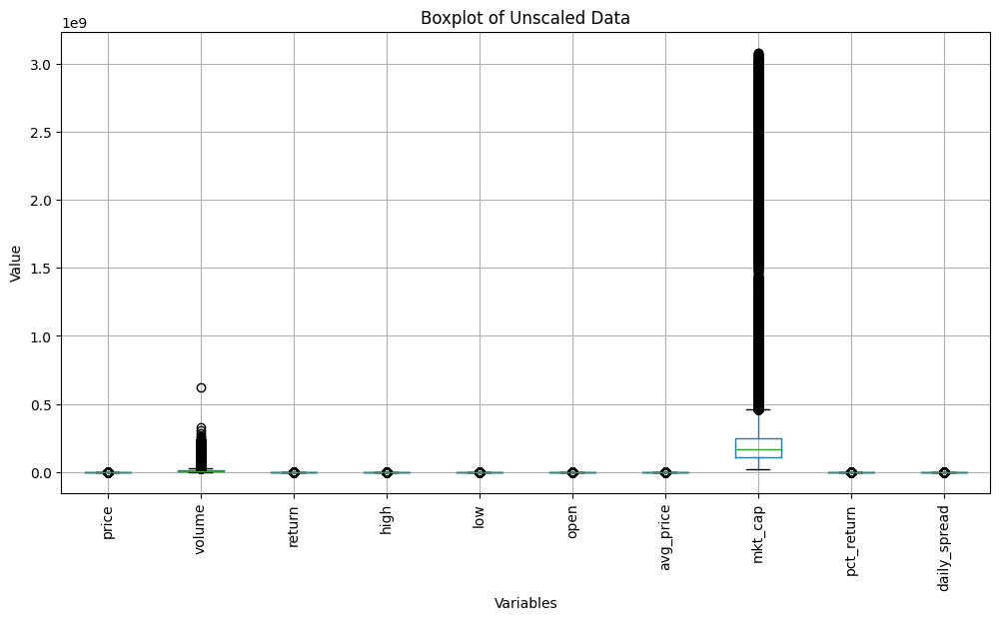

In [189]:
plt.figure(figsize=(12,6))
unscaled[numerical].boxplot(rot=90)
plt.title('Boxplot of Unscaled Data')
plt.ylabel('Value')
plt.xlabel('Variables')
plt.show()

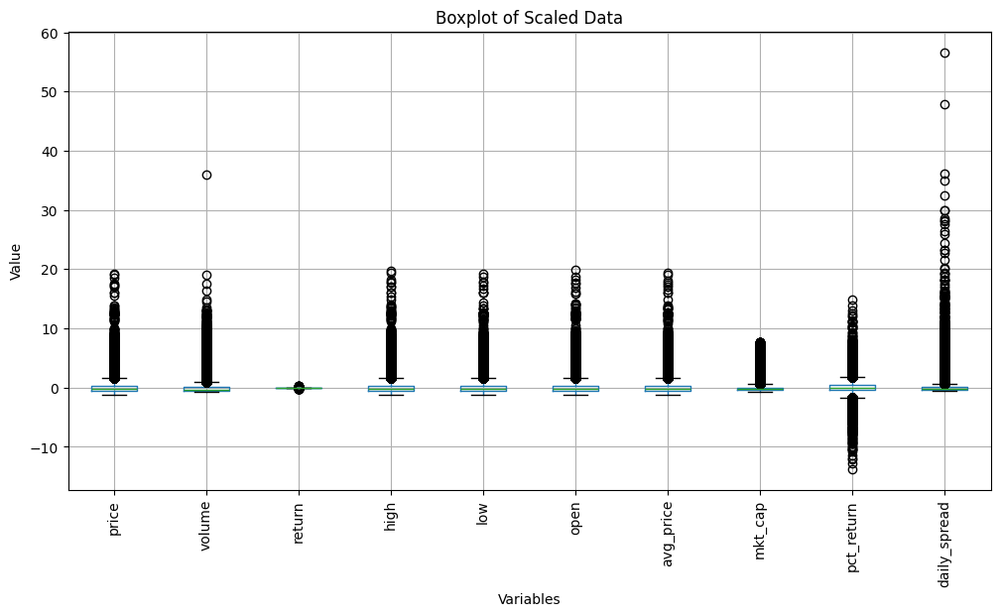

In [190]:
plt.figure(figsize=(12,6))
data[numerical].boxplot(rot=90)
plt.title('Boxplot of Scaled Data')
plt.ylabel('Value')
plt.xlabel('Variables')
plt.show()

In [200]:
columns = ['price', 'volume', 'return', 'high', 'low', 'open', 'avg_price', 'mkt_cap', 'pct_return', 'daily_spread', 'name_price_attention']
unscaled = unscaled[columns]

In [201]:
unscaled.describe()

,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,daily_spread,name_price_attention
count,70448.000000,7.044800e+04,70448.000000,70448.000000,70448.000000,70448.000000,70448.000000,7.044800e+04,70448.000000,70448.000000,70448.000000
mean,145.495397,1.157947e+07,0.000614,147.012658,143.910029,145.475873,145.461344,2.577778e+08,0.061384,3.102629,14.115716
std,108.420623,1.685646e+07,0.017407,110.429143,106.300702,108.378896,108.347582,3.664491e+08,1.740688,5.663514,15.396513
min,21.349900,3.053580e+05,-0.238484,21.620000,21.270000,21.340000,21.445000,1.715150e+07,-23.848400,0.090000,0.000000
25%,80.590000,3.327002e+06,-0.006783,81.240000,80.000000,80.580000,80.613750,1.069959e+08,-0.678300,1.040000,0.000000
50%,125.940000,6.196272e+06,0.000619,127.090000,124.750000,125.900000,125.850000,1.683775e+08,0.061900,1.870010,9.680000
75%,176.352508,1.294353e+07,0.008153,177.950000,174.610000,176.292492,176.281250,2.482573e+08,0.815300,3.450000,21.840000
max,2238.750000,6.182376e+08,0.260449,2318.489990,2186.520020,2295.120120,2252.505005,3.081156e+09,26.044900,323.879880,100.000000
